c:\Users\abhis\anaconda3\envs\test\Lib\site-packages\tslearn\bases\bases.py:15: UserWarning: h5py not installed, hdf5 features will not be supported.
Install h5py to use hdf5 features: http://docs.h5py.org/
  warn(h5py_msg)


--- Trajectory Clustering & Classification Script ---
Processing sample folder: '10'

Using thresholds:
  moving_threshold: 10.0000 (pixels)
  straightness_threshold: 1.2000 (ratio)
  hv_angle_tolerance_deg: 25.0000 (degrees)
  turn_threshold: 0.3491 (radians)
  sudden_change_threshold: 0.7854 (radians)
  final_segment_straight_tolerance: 0.4363 (radians)

Central zone polygon defined with 4 vertices.
Verify these vertices match the junction in the image for accuracy.

[Step 1/5] Loading and resampling data...
Found 58 IDs in AbnormalTracks_10.txt
Found 159 CSV files in 10
Successfully loaded and resampled 148 valid trajectories (>= 2 points).
Loaded and resampled 148 valid trajectories in 0.46 seconds.

[Step 2/5] Assigning custom clusters (10 rules)...
Found 80 straight H trajectories. Ref Angle H: 0.0 deg
Found 20 straight V trajectories. Ref Angle V: -90.0 deg
Assigned 148 custom cluster labels in 0.02 seconds.
10-Rule Cluster distribution:
  Cluster 1: 80, Cluster 4: 4, Cluster 7:

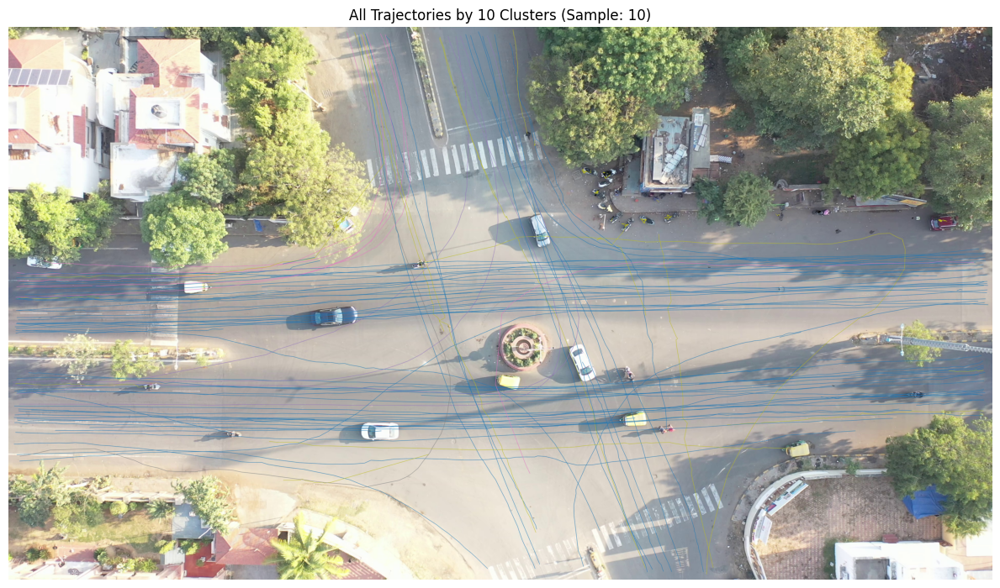


Generating visualization 2/5: Tracks (10 clusters) on grid plot...
Cluster grid plot saved to trajectory_images_clustered\clusters10_grid_10_20250412-223926.png


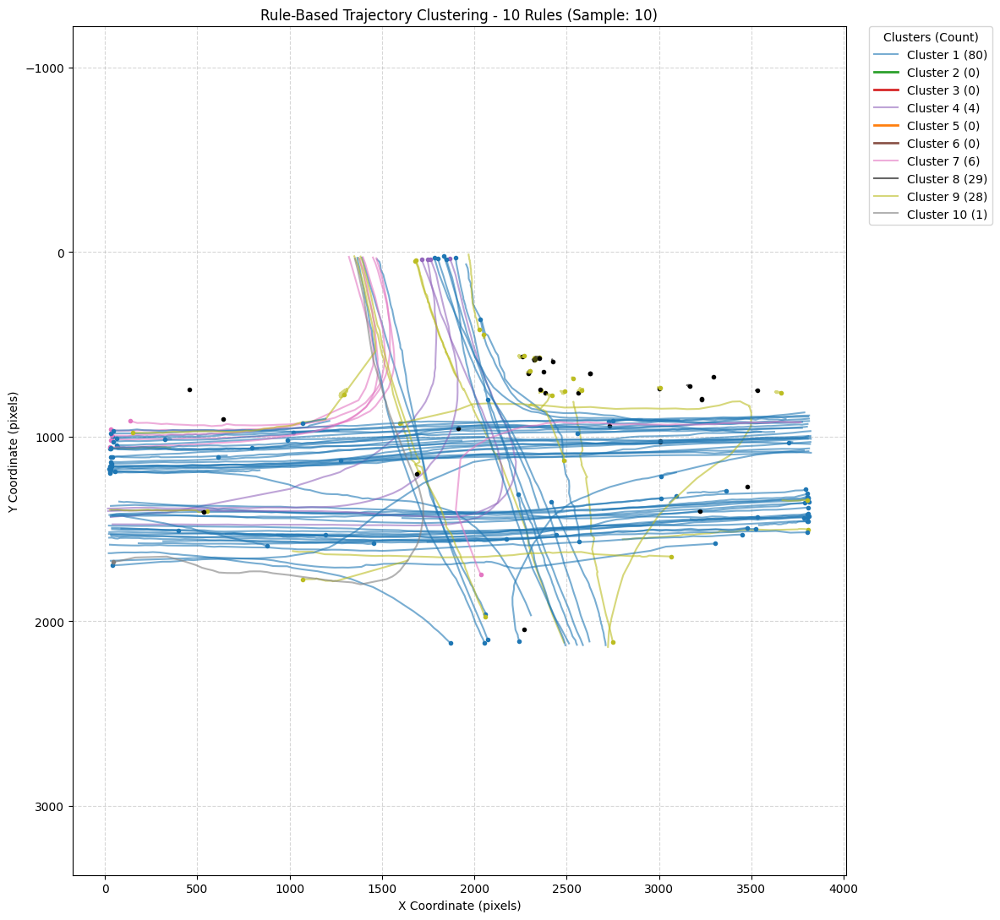


Generating visualization 3/5: NORMAL (Cluster 1) tracks on background image...
Drawing 80 trajectories for class 0 ('Normal (Cluster 1 = Straight) Trajectories - Sample 10')...
Visualization for Normal tracks saved to trajectory_images_clustered\Normal_tracks_on_image_10_20250412-223926.png


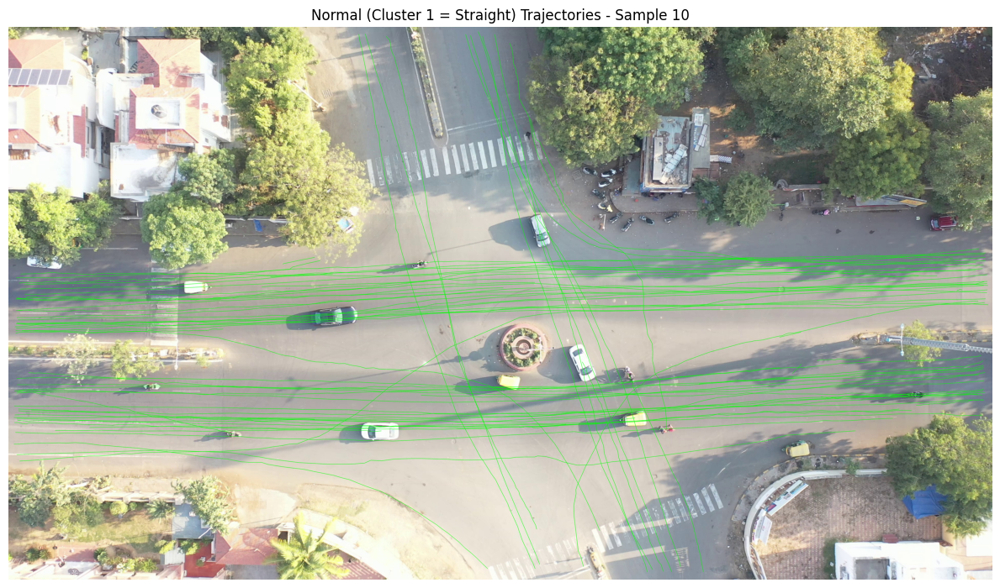


Generating visualization 4/5: ABNORMAL (Clusters 2-10) tracks on background image...
Drawing 68 trajectories for class 1 ('Abnormal (Clusters 2-10) Trajectories - Sample 10')...
Visualization for Abnormal tracks saved to trajectory_images_clustered\Abnormal_tracks_on_image_10_20250412-223928.png


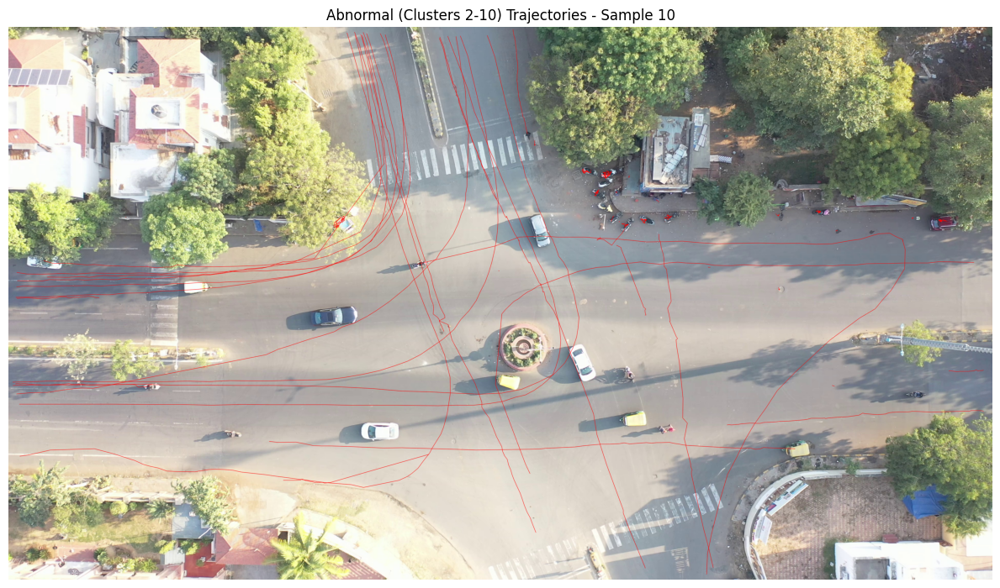


Generating visualization 5/5: Binary Classification (Normal/Abnormal) on background image...
Drawing 148 trajectories colored by binary classification for 'Binary Classification - Sample 10'...
Binary classification visualization saved to trajectory_images_clustered\BinaryClassification_NormalRed_AbnormalGreen_on_image_10_20250412-223929.png
 > Normal (Green): 80, Abnormal (Red): 68


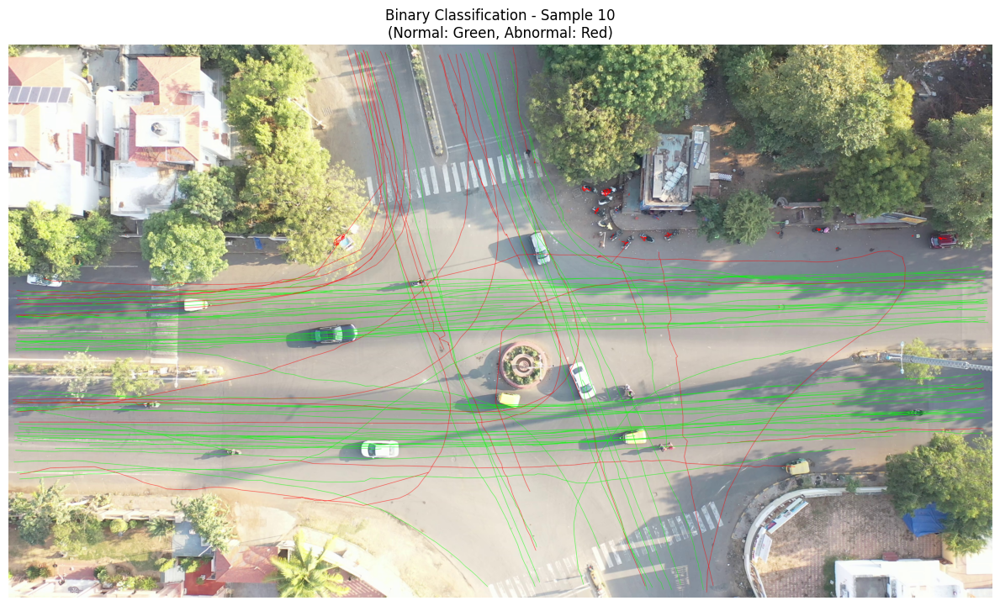


[Step 5/5] Optional steps...

--- Script Finished ---


In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
from tslearn.preprocessing import TimeSeriesResampler
# Note: StandardScaler, confusion_matrix, classification_report, accuracy_score
# are kept if needed for the optional evaluation part, otherwise they can be removed.
# from sklearn.preprocessing import StandardScaler
# from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
import time # For adding timestamp
import math # For angle calculations

# -----------------------------
# Parameters & Paths
# -----------------------------
sample = "10"  # Process folder "10" (adjust if needed)
folder_path = sample  # Folder containing CSV files for the sample
# Make sure this file exists or load_data will treat all tracks as normal
abnormal_txt_file = f"AbnormalTracks_{sample}.txt"
# Make sure this image exists for visualization, or handle the FileNotFoundError
image_path = f"sample{sample}.jpg"
output_dir = "trajectory_images_clustered"
os.makedirs(output_dir, exist_ok=True)
n_points = 50  # Number of points to resample each trajectory

# !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
# !! CRITICAL FOR ACCURACY: TUNE Thresholds & Define Central Zone BELOW !!
# !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!

# --- Thresholds for the custom clustering rules ---
# --- ADJUST THESE VALUES based on observing the classification results ---
moving_threshold = 10.0      # Max distance for cluster 8 (pixels). Increase if slow-moving valid tracks are marked stationary.
straightness_threshold = 1.2 # Max ratio (total path / direct distance) for cluster 1. Decrease for stricter straightness, Increase to allow more deviation.
# Angle range (degrees) around 0/180 and +/-90 to define H/V reference trajectories
hv_angle_tolerance_deg = 25.0 # Widen if main road directions aren't perfectly H/V.
# Min angle diff (radians) from closest H/V ref_angle for turns
turn_threshold = np.deg2rad(20) # Increase if gentle curves are wrongly marked as turns, decrease if sharp turns are missed.
# Min internal angle jump (radians) for sudden change (Cl 9)
sudden_change_threshold = np.deg2rad(45) # Decrease if subtle erratic moves should be Cl 9, increase if only very sharp changes are Cl 9.
# Angle tolerance (radians) for final segment check in rules 3 & 5
final_segment_straight_tolerance = np.deg2rad(25) # Widen if vehicles exiting the junction slightly curved are missed by rules 3/5.

# --- Central Junction/Roundabout Zone Polygon ---
# --- REPLACE Example Coordinates with ACTUAL pixel coordinates from sample10.jpg ---
# --- Use an image editor (like GIMP, Paint.NET, Photoshop) to find vertex (x, y) coords ---
# --- The ACCURACY of rules 3, 5, 6, 7 DEPENDS ENTIRELY ON THIS POLYGON ---
central_zone_polygon = np.array([
    # [x1, y1], [x2, y2], [x3, y3], [x4, y4], ... # Add vertices in order (clockwise or counter-clockwise)
    [350, 300], [500, 300], [500, 400], [350, 400] # <--- EXAMPLE! REPLACE THIS LINE!
], dtype=np.int32) # Use int32 for OpenCV drawing functions


# -----------------------------
# Trajectory Extraction, Resampling, and Loading Functions (Unchanged)
# -----------------------------
def extract_trajectory(csv_path):
    """Extracts frame number and center coordinates from a CSV file."""
    try:
        df = pd.read_csv(csv_path, usecols=["frameNo", "left", "top", "w", "h"])
        df["center_x"] = df["left"] + df["w"] / 2
        df["center_y"] = df["top"] + df["h"] / 2
        return df[["frameNo", "center_x", "center_y"]].values
    except FileNotFoundError:
        return None
    except Exception as e:
        print(f"Error processing file {csv_path}: {e}")
        return None

def resample_trajectory(traj, n_points=50):
    """Resamples a trajectory (x, y coordinates) to have a fixed number of points."""
    traj = np.asarray(traj)
    if traj.shape[0] < 2:
        return traj # Cannot resample if less than 2 points

    xy_coords = traj[:, 1:3]
    # Ensure the input is 3D for tslearn (batch_size, time_steps, features)
    traj_reshaped = xy_coords.reshape(1, xy_coords.shape[0], 2)

    try:
        # Only resample if the original trajectory has at least 2 points
        if traj_reshaped.shape[1] >= 2:
            resampler = TimeSeriesResampler(sz=n_points)
            resampled_xy = resampler.fit_transform(traj_reshaped)[0]
        else: # If less than 2 points originally, just repeat the single point
             # This case should ideally be filtered out before resampling,
             # but handle it defensively.
             resampled_xy = np.repeat(xy_coords, n_points, axis=0)


        # Interpolate frame numbers
        original_frames = traj[:, 0]
        resampled_frames = np.linspace(original_frames[0], original_frames[-1], n_points)
        resampled_traj = np.column_stack((resampled_frames, resampled_xy))
        return resampled_traj
    except Exception as e:
        # More specific error message if possible
        # print(f"Error during resampling for trajectory with original shape {traj.shape}: {e}. Returning original.")
        # Fallback: Return the original trajectory if resampling fails
        # Or consider returning None if failed resampling means it's unusable
        return traj if len(traj) >= 2 else None # Return original if it has >=2 pts

def load_data(folder_path, abnormal_txt_file, n_points):
    """Loads trajectories from CSV files, distinguishing abnormal ones listed in the txt file."""
    try:
        with open(abnormal_txt_file, "r") as f:
            abnormal_ids = {line.strip().split(".")[0] for line in f if line.strip()}
            print(f"Found {len(abnormal_ids)} IDs in {abnormal_txt_file}")
    except FileNotFoundError:
        print(f"Warning: {abnormal_txt_file} not found. Assuming all tracks are initially 'normal' based on file presence.")
        abnormal_ids = set()

    all_files = set(os.listdir(folder_path))
    csv_files = [f for f in all_files if f.endswith('.csv')]
    print(f"Found {len(csv_files)} CSV files in {folder_path}")

    trajectories, true_labels, fnames = [], [], []
    processed_count = 0
    valid_traj_count = 0

    for fname in csv_files:
        processed_count += 1
        base_name = fname.split(".")[0]
        full_path = os.path.join(folder_path, fname)
        traj_raw = extract_trajectory(full_path)

        if traj_raw is not None and len(traj_raw) >= 2: # Need at least 2 points for directionality/resampling
            traj_resampled = resample_trajectory(traj_raw, n_points)
            if traj_resampled is not None and len(traj_resampled) >= 2: # Check again after resampling
                trajectories.append(traj_resampled)
                # Assign true label based on the abnormal list (if provided)
                true_labels.append(1 if base_name in abnormal_ids else 0)
                fnames.append(fname)
                valid_traj_count +=1
            # else:
                # print(f"Skipping {fname}: Resampling resulted in < 2 points.")
        # else:
             # print(f"Skipping {fname}: Raw trajectory extraction resulted in < 2 points or None.")
        # if processed_count % 100 == 0: # Progress indicator
            # print(f"Processed {processed_count}/{len(csv_files)} files...")


    print(f"Successfully loaded and resampled {valid_traj_count} valid trajectories (>= 2 points).")
    return trajectories, true_labels, fnames


# -----------------------------
# Helper Functions for Rule-Based Clustering (Unchanged logic, improved comments)
# -----------------------------
def angle_between_points(p1, p2):
    """Compute the angle (radians, -pi to pi) of the vector from point p1 to p2."""
    delta = p2 - p1 # Assumes p1, p2 are [x, y]
    return np.arctan2(delta[1], delta[0]) # atan2(y, x)

def smallest_angle_diff(angle1, angle2):
    """Smallest signed difference (angle1 - angle2) in radians [-pi, pi]."""
    diff = angle1 - angle2
    # Wrap difference to the range [-pi, pi]
    diff = (diff + np.pi) % (2 * np.pi) - np.pi
    return diff

def detect_sudden_change(traj, change_threshold_rad):
    """Checks if the maximum change in segment direction exceeds the threshold."""
    pts = traj[:, 1:3]
    if len(pts) < 3: return False, 0.0 # Need at least 3 points for two segments

    segment_vectors = np.diff(pts, axis=0)
    # Filter out zero-length segments to avoid issues with angle calculation
    norms = np.linalg.norm(segment_vectors, axis=1)
    non_zero_mask = norms > 1e-6 # Use a small tolerance
    segment_vectors = segment_vectors[non_zero_mask]
    if len(segment_vectors) < 2: return False, 0.0 # Need at least two valid segments

    # Calculate angles of valid segments
    angles = np.arctan2(segment_vectors[:, 1], segment_vectors[:, 0])
    # Calculate the differences between consecutive segment angles
    angle_diffs = smallest_angle_diff(angles[1:], angles[:-1])
    # Find the maximum absolute change
    max_change = np.max(np.abs(angle_diffs)) if angle_diffs.size > 0 else 0.0
    return max_change > change_threshold_rad, max_change

def compute_reference_angles(trajectories, straightness_thresh, angle_tolerance_deg):
    """
    Computes reference direction angles for HORIZONTAL and VERTICAL straight trajectories.
    Returns (ref_angle_h, ref_angle_v), where each can be None if not found.
    """
    straight_angles_h = []
    straight_angles_v = []
    angle_tolerance_rad = np.deg2rad(angle_tolerance_deg)

    for traj in trajectories:
        pts = traj[:, 1:3]
        if len(pts) < 2: continue
        start, end = pts[0], pts[-1]
        direct_distance = np.linalg.norm(end - start)
        # Avoid division by zero or near-zero
        if direct_distance < 1e-3: continue

        segment_lengths = np.linalg.norm(np.diff(pts, axis=0), axis=1)
        total_path = np.sum(segment_lengths)
        # Avoid issues if path length is zero (e.g., stationary)
        if total_path < 1e-3: continue

        ratio = total_path / direct_distance
        # Check if it's straight enough
        if ratio < straightness_thresh:
            traj_angle = angle_between_points(start, end)
            # Check if angle is close to horizontal (0 or pi)
            if abs(smallest_angle_diff(traj_angle, 0)) < angle_tolerance_rad or \
               abs(smallest_angle_diff(traj_angle, np.pi)) < angle_tolerance_rad:
                straight_angles_h.append(traj_angle)
            # Check if angle is close to vertical (pi/2 or -pi/2)
            elif abs(smallest_angle_diff(traj_angle, np.pi/2)) < angle_tolerance_rad or \
                 abs(smallest_angle_diff(traj_angle, -np.pi/2)) < angle_tolerance_rad:
                straight_angles_v.append(traj_angle)

    ref_angle_h, ref_angle_v = None, None
    # Calculate average horizontal angle using circular mean
    if straight_angles_h:
        mean_angle_h = np.arctan2(np.mean(np.sin(straight_angles_h)), np.mean(np.cos(straight_angles_h)))
        # Snap to 0 or pi based on which is closer
        ref_angle_h = 0 if abs(smallest_angle_diff(mean_angle_h, 0)) < abs(smallest_angle_diff(mean_angle_h, np.pi)) else np.pi
        print(f"Found {len(straight_angles_h)} straight H trajectories. Ref Angle H: {np.rad2deg(ref_angle_h):.1f} deg")
    else: print("Warning: No straight horizontal trajectories found for reference. Rule 5 might be unreliable.")
    # Calculate average vertical angle using circular mean
    if straight_angles_v:
        mean_angle_v = np.arctan2(np.mean(np.sin(straight_angles_v)), np.mean(np.cos(straight_angles_v)))
        # Snap to pi/2 or -pi/2 based on which is closer
        ref_angle_v = np.pi/2 if abs(smallest_angle_diff(mean_angle_v, np.pi/2)) < abs(smallest_angle_diff(mean_angle_v, -np.pi/2)) else -np.pi/2
        print(f"Found {len(straight_angles_v)} straight V trajectories. Ref Angle V: {np.rad2deg(ref_angle_v):.1f} deg")
    else: print("Warning: No straight vertical trajectories found for reference. Rules 3 & 4 might be unreliable.")
    return ref_angle_h, ref_angle_v

def intersects_zone(traj, zone_polygon):
    """Checks if any point of the trajectory falls inside the given polygon zone."""
    # Ensure polygon has enough vertices to be valid
    if zone_polygon is None or len(zone_polygon) < 3: return False

    points = traj[:, 1:3].astype(np.float32) # Ensure float for cv2.pointPolygonTest

    for point in points:
        # pointPolygonTest returns >0 for inside, 0 for on boundary, <0 for outside
        if cv2.pointPolygonTest(zone_polygon, tuple(point), False) >= 0:
            return True
    return False

# -----------------------------
# Rule-Based Clustering Logic (10 Rules) - Unchanged Logic
# -----------------------------
def assign_custom_cluster_10(traj, ref_angle_h, ref_angle_v, central_zone, thresholds):
    """Assigns cluster ID 1-10 based on the defined rules."""
    pts = traj[:, 1:3]
    if len(pts) < 2: return 10 # Fallback: Cannot classify with < 2 points

    start, end = pts[0], pts[-1]
    direct_distance = np.linalg.norm(end - start)

    # Rule 8: Stationary (or very short movement)
    if direct_distance < thresholds['moving_threshold']: return 8

    # Rule 9: Sudden Change in Direction
    had_sudden_change, max_change = detect_sudden_change(traj, thresholds['sudden_change_threshold'])
    if had_sudden_change: return 9

    # Calculate path properties
    segment_lengths = np.linalg.norm(np.diff(pts, axis=0), axis=1)
    total_path = np.sum(segment_lengths)
    # Handle potential division by zero if direct_distance is very small (already checked by moving_threshold but be safe)
    straightness_ratio = total_path / direct_distance if direct_distance > 1e-6 else np.inf
    traj_angle = angle_between_points(start, end) # Overall direction angle
    is_intersecting_center = intersects_zone(traj, central_zone)

    # Determine closest reference direction (H or V) and the angle difference
    closest_ref, angle_diff_h, angle_diff_v, angle_diff_closest = None, np.inf, np.inf, np.inf
    min_angle_diff_abs = np.inf
    if ref_angle_h is not None:
        angle_diff_h = smallest_angle_diff(traj_angle, ref_angle_h)
        if abs(angle_diff_h) < min_angle_diff_abs:
            min_angle_diff_abs = abs(angle_diff_h)
            closest_ref = 'H'
            angle_diff_closest = angle_diff_h
    if ref_angle_v is not None:
        angle_diff_v = smallest_angle_diff(traj_angle, ref_angle_v)
        if abs(angle_diff_v) < min_angle_diff_abs:
            # Update closest only if this is strictly smaller diff than H
            min_angle_diff_abs = abs(angle_diff_v)
            closest_ref = 'V'
            angle_diff_closest = angle_diff_v

    # --- Apply Rules ---

    # Rule 1: Straight Trajectory
    if straightness_ratio < thresholds['straightness_threshold']: return 1

    # If no reference angles found, cannot apply turn rules accurately -> Fallback
    if closest_ref is None: return 10

    # --- Turning Rules (require a reference direction) ---
    turn_thresh_rad = thresholds['turn_threshold']
    final_seg_tol_rad = thresholds['final_segment_straight_tolerance']

    # Rule 2: Left Turn relative to Horizontal reference
    # Positive angle_diff_h means trajectory angle is counter-clockwise from ref_angle_h
    if closest_ref == 'H' and angle_diff_h > turn_thresh_rad: return 2

    # Rule 4: Right Turn relative to Vertical reference
    # Negative angle_diff_v means trajectory angle is clockwise from ref_angle_v
    if closest_ref == 'V' and angle_diff_v < -turn_thresh_rad: return 4

    # Rule 3: Left Turn relative to Vertical, Intersects Zone, Exits Vertically
    if closest_ref == 'V' and angle_diff_v > turn_thresh_rad and is_intersecting_center:
        if len(pts) >= 2: # Ensure there's a final segment
            final_segment_angle = angle_between_points(pts[-2], pts[-1])
            # Check if final segment is close to the vertical reference angle
            if ref_angle_v is not None and abs(smallest_angle_diff(final_segment_angle, ref_angle_v)) < final_seg_tol_rad:
                return 3

    # Rule 5: Right Turn relative to Horizontal, Intersects Zone, Exits Horizontally
    if closest_ref == 'H' and angle_diff_h < -turn_thresh_rad and is_intersecting_center:
         if len(pts) >= 2: # Ensure there's a final segment
            final_segment_angle = angle_between_points(pts[-2], pts[-1])
            # Check if final segment is close to the horizontal reference angle
            if ref_angle_h is not None and abs(smallest_angle_diff(final_segment_angle, ref_angle_h)) < final_seg_tol_rad:
                return 5

    # Rule 6: General Right Turn, Intersects Zone (and not already Rule 4 or 5)
    # angle_diff_closest < -turn_thresh_rad means it's a right turn relative to its *closest* reference
    if angle_diff_closest < -turn_thresh_rad and is_intersecting_center:
        # Check if it already qualified as Rule 4
        is_rule_4 = (closest_ref == 'V' and angle_diff_v < -turn_thresh_rad)
        # Check if it already qualified as Rule 5
        is_rule_5 = False
        if closest_ref == 'H' and angle_diff_h < -turn_thresh_rad: # Condition for Rule 5 turn direction
            if len(pts) >= 2:
                final_segment_angle = angle_between_points(pts[-2], pts[-1])
                if ref_angle_h is not None and abs(smallest_angle_diff(final_segment_angle, ref_angle_h)) < final_seg_tol_rad:
                    is_rule_5 = True # It also met the exit condition for Rule 5
        # If it's a right turn intersecting the center, but didn't meet the specific exit conditions of Rule 4 or 5
        if not is_rule_4 and not is_rule_5:
            return 6

    # Rule 7: General Right Turn, Does NOT Intersect Zone (and not already Rule 4)
    if angle_diff_closest < -turn_thresh_rad and not is_intersecting_center:
         # Check if it already qualified as Rule 4 (Right turn wrt V)
        is_rule_4 = (closest_ref == 'V' and angle_diff_v < -turn_thresh_rad)
        # If it's a right turn not intersecting center and wasn't Rule 4
        if not is_rule_4:
            return 7

    # Rule 10: Fallback / Other (Could be left turns not covered, complex paths etc.)
    # If none of the above specific rules matched.
    return 10


def assign_custom_clusters_10(trajectories, central_zone, thresholds):
    """Applies the 10 custom rule–based clustering."""
    if not trajectories: return np.array([])
    clusters = []
    # Compute reference angles ONCE based on all trajectories
    ref_h, ref_v = compute_reference_angles(trajectories, thresholds['straightness_threshold'], thresholds['hv_angle_tolerance_deg'])

    for i, traj in enumerate(trajectories):
        # Basic check for valid trajectory structure
        if traj is None or not isinstance(traj, np.ndarray) or traj.ndim != 2 or traj.shape[1] != 3 or len(traj) < 2:
            clusters.append(10) # Assign fallback if trajectory is invalid
            # print(f"Warning: Invalid trajectory format encountered at index {i}. Assigning cluster 10.")
            continue
        try:
            cid = assign_custom_cluster_10(traj, ref_h, ref_v, central_zone, thresholds)
            clusters.append(cid)
        except Exception as e:
            print(f"Error assigning cluster for trajectory index {i}: {e}")
            clusters.append(10) # Assign fallback on error

    return np.array(clusters)

# -----------------------------
# Visualization Functions (MODIFIED and NEW)
# -----------------------------

def visualize_all_tracks_on_image(image_path, trajectories, labels, title="All Tracks on Image", output_filename_base="all_tracks_on_image", sample_id=None):
    """Visualizes ALL trajectories with 10 cluster colors overlaid on the background image. NO central zone drawn."""
    try:
        image = cv2.imread(image_path)
        if image is None:
            print(f"Error: Background image not found at {image_path}")
            # Create a black background as fallback if image missing
            max_x = 800
            max_y = 600
            if trajectories:
                 try:
                     all_x = np.concatenate([t[:, 1] for t in trajectories if t is not None and len(t)>0])
                     all_y = np.concatenate([t[:, 2] for t in trajectories if t is not None and len(t)>0])
                     if len(all_x) > 0: max_x = int(np.max(all_x)) + 50 # Add padding
                     if len(all_y) > 0: max_y = int(np.max(all_y)) + 50 # Add padding
                 except Exception as e:
                    print(f"Warning: Could not determine image bounds from trajectories: {e}")

            image = np.zeros((max_y, max_x, 3), dtype=np.uint8)
            print(f"Created blank background ({max_x}x{max_y}).")
    except Exception as e:
        print(f"Error reading image {image_path}: {e}")
        return

    # BGR Colors for OpenCV
    cmap_bgr = {
        1: (180, 119, 31),   # Blue
        2: (44, 160, 44),   # Green
        3: (40, 39, 214),   # Red (swapped BGR)
        4: (188, 119, 148), # Purple
        5: (0, 127, 255),   # Orange
        6: (75, 86, 140),   # Brown
        7: (194, 119, 227), # Pink
        8: (0, 0, 0),       # Black
        9: (34, 189, 188),  # Olive/Yellow
        10: (127, 127, 127) # Gray
    }
    fallback_color_bgr = (150, 150, 150) # Default gray
    line_thickness = 1 # Thin lines for less clutter

    print(f"Drawing {len(trajectories)} trajectories for '{output_filename_base}'...")
    overlay = image.copy()

    for i, (traj, lab) in enumerate(zip(trajectories, labels)):
        if traj is None or len(traj) < 2: continue
        color = cmap_bgr.get(lab, fallback_color_bgr)
        pts_int = traj[:, 1:3].astype(np.int32)
        # Draw line segments
        for j in range(len(pts_int) - 1):
            # Add checks for points being within image bounds (optional but safer)
            # if 0 <= pts_int[j][0] < image.shape[1] and 0 <= pts_int[j][1] < image.shape[0] and \
            #    0 <= pts_int[j+1][0] < image.shape[1] and 0 <= pts_int[j+1][1] < image.shape[0]:
                 try: # Add try-except for rare drawing errors
                    cv2.line(overlay, tuple(pts_int[j]), tuple(pts_int[j+1]), color, line_thickness, cv2.LINE_AA)
                 except Exception as draw_err:
                    # print(f"Warning: Error drawing line segment {j} for trajectory {i}: {draw_err}")
                    pass

    # --- REMOVED: Central zone polygon drawing ---
    # if central_zone_poly is not None and len(central_zone_poly) >= 3:
    #     cv2.polylines(overlay, [central_zone_poly.reshape((-1, 1, 2))], isClosed=True, color=(0, 255, 0), thickness=2, lineType=cv2.LINE_AA)

    image = overlay # Use the overlay with drawn trajectories

    timestamp = time.strftime("%Y%m%d-%H%M%S")
    sample_str = f"_{sample_id}" if sample_id else ""
    save_path = os.path.join(output_dir, f"{output_filename_base}{sample_str}_{timestamp}.png")
    try:
        cv2.imwrite(save_path, image)
        print(f"Combined trajectory visualization (10 clusters) saved to {save_path}")
    except Exception as e:
        print(f"Error saving combined image: {e}")

    # Display using matplotlib
    plt.figure(figsize=(12, 9))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)) # Convert BGR to RGB for plt
    plt.title(title)
    plt.axis("off")
    plt.tight_layout()
    plt.show()


def visualize_specific_class_on_image(image_path, all_trajectories, all_binary_labels, target_label, output_dir, sample_id, title):
    """Visualizes trajectories belonging to a specific binary class (0=Normal, 1=Abnormal) on the background image. NO central zone drawn."""
    try:
        image = cv2.imread(image_path)
        if image is None:
            print(f"Error: Background image not found at {image_path} for {title}")
            # Fallback to black background
            max_x = 800
            max_y = 600
            if all_trajectories:
                 try:
                     all_x = np.concatenate([t[:, 1] for t in all_trajectories if t is not None and len(t)>0])
                     all_y = np.concatenate([t[:, 2] for t in all_trajectories if t is not None and len(t)>0])
                     if len(all_x) > 0: max_x = int(np.max(all_x)) + 50
                     if len(all_y) > 0: max_y = int(np.max(all_y)) + 50
                 except Exception: pass # Ignore if calculation fails
            image = np.zeros((max_y, max_x, 3), dtype=np.uint8)
            print(f"Created blank background ({max_x}x{max_y}) for {title}.")

    except Exception as e:
        print(f"Error reading image {image_path} for {title}: {e}")
        return

    # Define colors: Green for Normal (0), Red for Abnormal (1) (BGR)
    class_color = (0, 255, 0) if target_label == 0 else (0, 0, 255) # Green, Red in BGR
    line_thickness = 1

    trajectories_to_draw = []
    for traj, label in zip(all_trajectories, all_binary_labels):
        if label == target_label:
            if traj is not None and len(traj) >= 2:
                trajectories_to_draw.append(traj)

    print(f"Drawing {len(trajectories_to_draw)} trajectories for class {target_label} ('{title}')...")
    overlay = image.copy()

    for traj in trajectories_to_draw:
        pts_int = traj[:, 1:3].astype(np.int32)
        for j in range(len(pts_int) - 1):
             try:
                 cv2.line(overlay, tuple(pts_int[j]), tuple(pts_int[j+1]), class_color, line_thickness, cv2.LINE_AA)
             except Exception as draw_err:
                 # print(f"Warning: Error drawing line segment {j} for class {target_label}: {draw_err}")
                 pass


    # --- REMOVED: Central zone polygon drawing ---
    # if central_zone_poly is not None and len(central_zone_poly) >= 3:
    #     cv2.polylines(overlay, [central_zone_poly.reshape((-1, 1, 2))], isClosed=True, color=(0, 255, 255), thickness=2, lineType=cv2.LINE_AA)

    image = overlay

    # Save the combined image
    timestamp = time.strftime("%Y%m%d-%H%M%S")
    class_name = "Normal" if target_label == 0 else "Abnormal"
    save_path = os.path.join(output_dir, f"{class_name}_tracks_on_image_{sample_id}_{timestamp}.png")
    try:
        cv2.imwrite(save_path, image)
        print(f"Visualization for {class_name} tracks saved to {save_path}")
    except Exception as e:
        print(f"Error saving {class_name} tracks image: {e}")

    # Display using matplotlib
    plt.figure(figsize=(12, 9))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title(title)
    plt.axis("off")
    plt.tight_layout()
    plt.show()


# --- NEW FUNCTION: Visualize Binary Classification (Normal vs Abnormal) on one image ---
def visualize_binary_classification_on_image(image_path, trajectories, binary_labels, output_dir, sample_id, title):
    """Visualizes ALL trajectories on the background image, colored by BINARY classification (Normal=Green, Abnormal=Red)."""
    try:
        image = cv2.imread(image_path)
        if image is None:
            print(f"Error: Background image not found at {image_path} for {title}")
            # Fallback to black background
            max_x = 800; max_y = 600
            if trajectories:
                 try:
                     all_x = np.concatenate([t[:, 1] for t in trajectories if t is not None and len(t)>0])
                     all_y = np.concatenate([t[:, 2] for t in trajectories if t is not None and len(t)>0])
                     if len(all_x) > 0: max_x = int(np.max(all_x)) + 50
                     if len(all_y) > 0: max_y = int(np.max(all_y)) + 50
                 except Exception: pass
            image = np.zeros((max_y, max_x, 3), dtype=np.uint8)
            print(f"Created blank background ({max_x}x{max_y}) for {title}.")
    except Exception as e:
        print(f"Error reading image {image_path} for {title}: {e}")
        return

    # Define colors (BGR for OpenCV)
    color_normal = (0, 255, 0)   # Green
    color_abnormal = (0, 0, 255) # Red
    line_thickness = 1

    print(f"Drawing {len(trajectories)} trajectories colored by binary classification for '{title}'...")
    overlay = image.copy()

    normal_count, abnormal_count = 0, 0
    for i, (traj, binary_label) in enumerate(zip(trajectories, binary_labels)):
        if traj is None or len(traj) < 2: continue

        color = color_normal if binary_label == 0 else color_abnormal
        if binary_label == 0: normal_count += 1
        else: abnormal_count += 1

        pts_int = traj[:, 1:3].astype(np.int32)
        for j in range(len(pts_int) - 1):
            try:
                cv2.line(overlay, tuple(pts_int[j]), tuple(pts_int[j+1]), color, line_thickness, cv2.LINE_AA)
            except Exception as draw_err:
                 # print(f"Warning: Error drawing binary line segment {j} for trajectory {i}: {draw_err}")
                 pass

    image_result = overlay

    # Save the combined image
    timestamp = time.strftime("%Y%m%d-%H%M%S")
    save_path = os.path.join(output_dir, f"BinaryClassification_NormalRed_AbnormalGreen_on_image_{sample_id}_{timestamp}.png")
    try:
        cv2.imwrite(save_path, image_result)
        print(f"Binary classification visualization saved to {save_path}")
        print(f" > Normal (Green): {normal_count}, Abnormal (Red): {abnormal_count}")
    except Exception as e:
        print(f"Error saving binary classification image: {e}")

    # Display using matplotlib
    plt.figure(figsize=(12, 9))
    plt.imshow(cv2.cvtColor(image_result, cv2.COLOR_BGR2RGB)) # Convert BGR->RGB
    plt.title(f"{title}\n(Normal: Green, Abnormal: Red)")
    plt.axis("off")
    plt.tight_layout()
    plt.show()



def visualize_trajectories_10(trajectories, labels, title="Trajectories Grid Plot", sample_id=None):
    """Visualizes trajectories on a blank grid with colors based on 10 cluster labels. NO central zone drawn."""
    plt.figure(figsize=(14, 11))
    # Matplotlib default color cycle (approximated)
    cmap_plt = {
        1: '#1f77b4', 2: '#ff7f0e', 3: '#2ca02c', 4: '#d62728', 5: '#9467bd',
        6: '#8c564b', 7: '#e377c2', 8: '#7f7f7f', 9: '#bcbd22', 10: '#17becf' # Swapped 8 and 10 for better visibility maybe
    }
    # Custom colors matching the BGR ones used earlier (approximate hex)
    cmap_custom_hex = {
         1: '#1F77B4',  # Blue
         2: '#2CA02C',  # Green
         3: '#D62728',  # Red
         4: '#9467BD',  # Purple
         5: '#FF7F0E',  # Orange
         6: '#8C564B',  # Brown
         7: '#E377C2',  # Pink
         8: '#000000',  # Black
         9: '#BCBD22',  # Olive
         10: '#7F7F7F'  # Gray
    }
    cmap_to_use = cmap_custom_hex # Choose which colormap dict to use

    fallback_color = '#adb5bd' # Light gray for unassigned/errors
    label_counts = {i: 0 for i in range(1, 11)}
    plotted_labels_legend = set()

    for i, (traj, lab) in enumerate(zip(trajectories, labels)):
        if traj is None or len(traj) < 2: continue
        # Ensure label is an integer key
        try:
             current_label = int(lab)
             col = cmap_to_use.get(current_label, fallback_color)
             label_counts[current_label] = label_counts.get(current_label, 0) + 1
        except (ValueError, TypeError):
             current_label = -1 # Indicate invalid label
             col = fallback_color


        label_str = f"Cluster {current_label}" if current_label != -1 else "Invalid Cluster"
        plt.plot(traj[:, 1], traj[:, 2], color=col, alpha=0.6, linewidth=1.5,
                 label=label_str if current_label !=-1 and current_label not in plotted_labels_legend else "")
        # Mark start point
        plt.plot(traj[0, 1], traj[0, 2], 'o', color=col, markersize=3)
        if current_label != -1:
            plotted_labels_legend.add(current_label)


    # --- REMOVED: Central zone polygon drawing ---
    # if central_zone_poly is not None and len(central_zone_poly) > 0:
    #     poly_closed = np.vstack([central_zone_poly, central_zone_poly[0]])
    #     plt.plot(poly_closed[:, 0], poly_closed[:, 1], '--', color='lime', linewidth=2, label='Central Zone')

    plt.title(title)
    plt.xlabel("X Coordinate (pixels)")
    plt.ylabel("Y Coordinate (pixels)")
    plt.gca().invert_yaxis() # Origin typically at top-left in images
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.axis('equal') # Ensure aspect ratio is maintained

    # Create Legend
    handles, current_labels = plt.gca().get_legend_handles_labels()
    unique_handles_dict = {} # Use dict to ensure one entry per label
    for h, l in zip(handles, current_labels):
        if l not in unique_handles_dict:
             try: # Add counts to the label
                cluster_num = int(l.split(' ')[1])
                count = label_counts.get(cluster_num, 0)
                h.set_label(f'Cluster {cluster_num} ({count})')
                unique_handles_dict[l] = h
             except: # Keep original label if parsing fails
                 unique_handles_dict[l] = h

    # Add legend entries for clusters that might not have been plotted (e.g., count 0)
    # or if labels weren't generated due to plotting options
    for i in range(1, 11):
        label_str = f'Cluster {i}'
        full_label_str = f'Cluster {i} ({label_counts.get(i, 0)})'
        if label_str not in unique_handles_dict:
            unique_handles_dict[label_str] = plt.Line2D([0], [0], color=cmap_to_use.get(i, fallback_color), lw=2, label=full_label_str)

    # Sort legend entries numerically by cluster number
    sorted_handles = sorted(unique_handles_dict.values(), key=lambda h: int(h.get_label().split(' ')[1]) if 'Cluster' in h.get_label() else 99)

    plt.legend(handles=sorted_handles, title="Clusters (Count)", bbox_to_anchor=(1.03, 1), loc='upper left', borderaxespad=0.)
    plt.tight_layout(rect=[0, 0, 0.85, 1]) # Adjust layout to make space for legend

    timestamp = time.strftime("%Y%m%d-%H%M%S")
    sample_str = f"_{sample_id}" if sample_id else ""
    save_path = os.path.join(output_dir, f"clusters10_grid{sample_str}_{timestamp}.png")
    try:
        plt.savefig(save_path, bbox_inches='tight')
        print(f"Cluster grid plot saved to {save_path}")
    except Exception as e: print(f"Error saving grid plot: {e}")
    plt.show()


# visualize_track function remains unchanged - useful for debugging single tracks
def visualize_track(image_path, traj, window_name="Track Visualization", cluster_id=None):
    """Visualizes a single trajectory on a background image."""
    try: image = cv2.imread(image_path)
    except Exception as e: print(f"Error reading image {image_path}: {e}"); return
    if image is None: print(f"Warning: Background image {image_path} not found."); return

    color=(0, 0, 255); thickness=2 # Default: Red
    if cluster_id is not None: # Example coloring based on 10 clusters
         cmap_bgr = { 1: (180, 119, 31), 2: (44, 160, 44), 3: (40, 39, 214), 4: (188, 119, 148), 5: (0, 127, 255), 6: (75, 86, 140), 7: (194, 119, 227), 8: (0, 0, 0), 9: (34, 189, 188), 10: (127, 127, 127)}
         color = cmap_bgr.get(cluster_id, (0,0,255)) # Fallback to red

    pts_int = traj[:, 1:3].astype(np.int32)
    for i in range(len(pts_int) - 1):
        cv2.line(image, tuple(pts_int[i]), tuple(pts_int[i+1]), color, thickness, cv2.LINE_AA)

    if len(pts_int) > 0:
        cv2.circle(image, tuple(pts_int[0]), 5, (0, 255, 0), -1) # Green start circle
        cv2.drawMarker(image, tuple(pts_int[-1]), (255, 0, 0), cv2.MARKER_CROSS, 10, 2) # Blue end cross

    plt.figure(figsize=(10, 8)); plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    title = window_name + (f" - Assigned 10-Rule Cluster: {cluster_id}" if cluster_id is not None else "")
    plt.title(title); plt.axis("off"); plt.show()


# -----------------------------
# Main Execution Pipeline
# -----------------------------
if __name__ == "__main__":

    print(f"--- Trajectory Clustering & Classification Script ---")
    print(f"Processing sample folder: '{folder_path}'")
    # Define thresholds dictionary
    threshold_params = {
        'moving_threshold': moving_threshold,
        'straightness_threshold': straightness_threshold,
        'hv_angle_tolerance_deg': hv_angle_tolerance_deg,
        'turn_threshold': turn_threshold,
        'sudden_change_threshold': sudden_change_threshold,
        'final_segment_straight_tolerance': final_segment_straight_tolerance,
    }
    print("\nUsing thresholds:")
    for k, v in threshold_params.items():
        unit = ""
        if 'threshold' in k or 'tolerance' in k :
            if 'deg' in k: unit = " (degrees)"
            elif k == 'moving_threshold': unit = " (pixels)"
            elif k == 'straightness_threshold': unit = " (ratio)"
            else: unit = " (radians)" # Default for angle thresholds unless deg specified
        print(f"  {k}: {v:.4f}{unit}")

    # --- CRITICAL CHECK: Central Zone Polygon ---
    if central_zone_polygon is None or not isinstance(central_zone_polygon, np.ndarray) or central_zone_polygon.ndim != 2 or len(central_zone_polygon) < 3:
          print("\n!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!")
          print("!! ERROR: 'central_zone_polygon' is not defined correctly.       !!")
          print("!! Please edit the script and add the ACTUAL pixel coordinates   !!")
          print(f"!! for the central roundabout/junction area from '{image_path}'.  !!")
          print("!! Accuracy of rules 3, 5, 6, 7 depends on this definition.      !!")
          print("!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!")
          # Consider exiting if the zone is essential and undefined
          # exit()
          print("\nWarning: Proceeding without a valid central zone. Rules 3, 5, 6, 7 may be inaccurate.")
    else:
          print(f"\nCentral zone polygon defined with {len(central_zone_polygon)} vertices.")
          print("Verify these vertices match the junction in the image for accuracy.")


    # 1. Load Trajectories
    print("\n[Step 1/5] Loading and resampling data...")
    start_time = time.time()
    if not os.path.isdir(folder_path):
          print(f"Error: Source folder '{folder_path}' not found.")
          exit()
    # Pass n_points to load_data if resampling happens there (it does)
    trajectories, true_labels_original, file_names = load_data(folder_path, abnormal_txt_file, n_points)
    load_time = time.time() - start_time
    print(f"Loaded and resampled {len(trajectories)} valid trajectories in {load_time:.2f} seconds.")

    if not trajectories:
        print("No valid trajectories found or loaded. Exiting.")
    else:
        # 2. Assign Custom Clusters based on 10 Rules
        print("\n[Step 2/5] Assigning custom clusters (10 rules)...")
        start_time = time.time()
        # Pass central_zone_polygon here
        custom_clusters = assign_custom_clusters_10(trajectories, central_zone_polygon, threshold_params)
        cluster_time = time.time() - start_time
        print(f"Assigned {len(custom_clusters)} custom cluster labels in {cluster_time:.2f} seconds.")

        if len(custom_clusters) != len(trajectories):
             print(f"Warning: Mismatch between number of trajectories ({len(trajectories)}) and assigned clusters ({len(custom_clusters)}).")
             # Handle mismatch - e.g. maybe skip classification/viz or try to align
        else:
            unique_clusters, counts = np.unique(custom_clusters, return_counts=True)
            print("10-Rule Cluster distribution:")
            cluster_dist_str = ", ".join([f"Cluster {cl_id}: {count}" for cl_id, count in zip(unique_clusters, counts)])
            print(f"  {cluster_dist_str}")

            # 3. Perform Binary Classification based on Clustering Results
            print("\n[Step 3/5] Performing binary classification (Rule 1=Normal, Rules 2-10=Abnormal)...")
            # 0 = Normal (Straight, Cluster 1)
            # 1 = Abnormal (Clusters 2-10)
            binary_labels_derived = np.array([0 if c == 1 else 1 for c in custom_clusters])

            normal_count = np.sum(binary_labels_derived == 0)
            abnormal_count = np.sum(binary_labels_derived == 1)
            print(f"Binary Classification Results: Normal (Cluster 1): {normal_count}, Abnormal (Clusters 2-10): {abnormal_count}")


            # 4. Visualization
            print("\n[Step 4/5] Generating visualizations...")

            # --- Visualization 1: All tracks overlaid on the background image (using 10 cluster colors) ---
            print("Generating visualization 1/5: All tracks (10 clusters) on background image...")
            visualize_all_tracks_on_image(image_path, trajectories, custom_clusters,
                                          title=f"All Trajectories by 10 Clusters (Sample: {sample})",
                                          output_filename_base="all_tracks_10clusters_on_image",
                                          sample_id=sample)

            # --- Visualization 2: Tracks plotted on a blank grid (using 10 cluster colors) ---
            print("\nGenerating visualization 2/5: Tracks (10 clusters) on grid plot...")
            visualize_trajectories_10(trajectories, custom_clusters,
                                      title=f"Rule-Based Trajectory Clustering - 10 Rules (Sample: {sample})",
                                      sample_id=sample) # Pass sample_id for filename

            # --- Visualization 3: NORMAL (Straight/Cluster 1) tracks only on background image ---
            print("\nGenerating visualization 3/5: NORMAL (Cluster 1) tracks on background image...")
            visualize_specific_class_on_image(image_path, trajectories, binary_labels_derived, 0, # Target label 0 = Normal
                                              output_dir, sample,
                                              title=f"Normal (Cluster 1 = Straight) Trajectories - Sample {sample}")

            # --- Visualization 4: ABNORMAL (Clusters 2-10) tracks only on background image ---
            print("\nGenerating visualization 4/5: ABNORMAL (Clusters 2-10) tracks on background image...")
            visualize_specific_class_on_image(image_path, trajectories, binary_labels_derived, 1, # Target label 1 = Abnormal
                                              output_dir, sample,
                                              title=f"Abnormal (Clusters 2-10) Trajectories - Sample {sample}")

            # --- Visualization 5: NEW - Binary Classification (Normal/Abnormal) on ONE image ---
            print("\nGenerating visualization 5/5: Binary Classification (Normal/Abnormal) on background image...")
            visualize_binary_classification_on_image(image_path, trajectories, binary_labels_derived,
                                                     output_dir, sample,
                                                     title=f"Binary Classification - Sample {sample}")


            # 5. Optional Steps (e.g., evaluation, saving results)
            print("\n[Step 5/5] Optional steps...")
            # --- Optional: Visualize a single specific track for debugging ---
            # index_to_show = 5 # Example: show the 6th track (index 5)
            # if 0 <= index_to_show < len(trajectories) and index_to_show < len(file_names) and index_to_show < len(custom_clusters):
            #      print(f"\nVisualizing single trajectory '{file_names[index_to_show]}' (Index {index_to_show}) on background image...")
            #      visualize_track(image_path, trajectories[index_to_show],
            #                      window_name=f"Track: {file_names[index_to_show]}",
            #                      cluster_id=custom_clusters[index_to_show]) # Show its 10-rule cluster ID
            # else:
            #      print(f"\nCannot visualize single track: Index {index_to_show} out of bounds or data mismatch.")

            # --- Optional: Save cluster assignments and binary labels to a file ---
            # results_df = pd.DataFrame({
            #     'filename': file_names,
            #     'cluster_10_rules': custom_clusters,
            #     'binary_label_derived': binary_labels_derived,
            #     'true_label_original': true_labels_original # From AbnormalTracks file (if available)
            # })
            # results_filename = os.path.join(output_dir, f"clustering_results_{sample}_{time.strftime('%Y%m%d-%H%M%S')}.csv")
            # try:
            #     results_df.to_csv(results_filename, index=False)
            #     print(f"\nClustering results saved to: {results_filename}")
            # except Exception as e:
            #     print(f"\nError saving results to CSV: {e}")


    print("\n--- Script Finished ---")

--- Trajectory Clustering & Classification Script ---
Processing sample folder: '12'
Output directory: 'trajectory_images_clustered'

Using thresholds:
  moving_threshold: 10.0000 (pixels)
  straightness_threshold: 1.2000 (ratio)
  hv_angle_tolerance_deg: 25.0000 (degrees)
  turn_threshold: 0.3491 (radians)
  sudden_change_threshold: 0.7854 (radians)
  final_segment_straight_tolerance: 0.4363 (radians)

Central zone polygon defined with 4 vertices.

[Step 1/4] Loading and resampling data...
Found 276 CSV files in 12
Successfully loaded and resampled 272 valid trajectories (>= 2 points).
Data loading completed in 0.86 seconds.

[Step 2/4] Assigning custom clusters (10 rules)...
Found 181 straight H trajectories. Ref Angle H: 180.0 deg
Found 25 straight V trajectories. Ref Angle V: 90.0 deg
Assigned 272 cluster labels in 0.03 seconds.
10-Rule Cluster distribution:
  Cluster 1: 188, Cluster 4: 6, Cluster 7: 6, Cluster 8: 27, Cluster 9: 44, Cluster 10: 1

[Step 3/4] Performing binary class

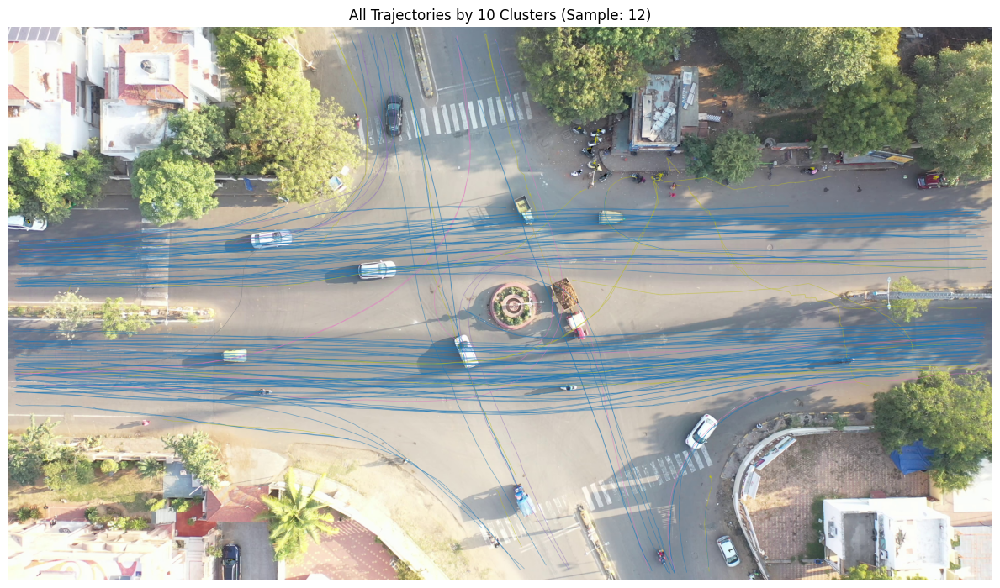


Generating visualization 2/3: Tracks (10 clusters) on grid plot...
Cluster grid plot saved to trajectory_images_clustered\clusters10_grid_12_20250413-002237.png


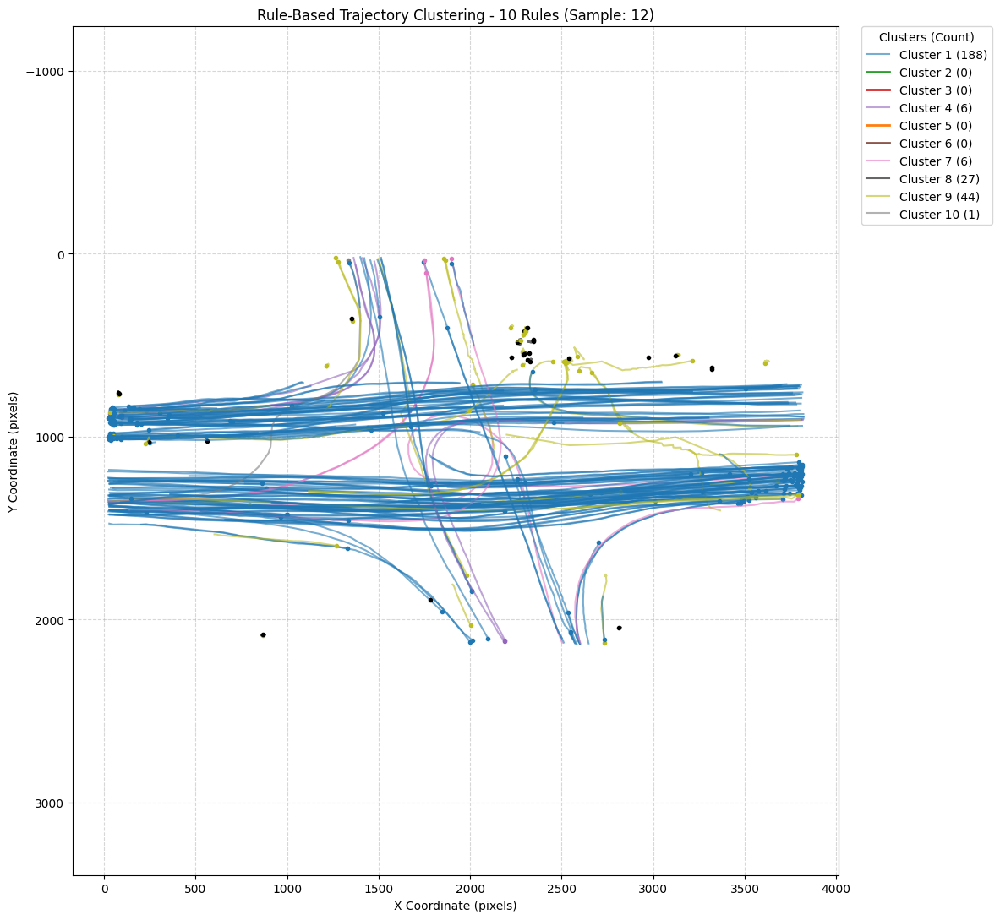


Generating visualization 3/3: Binary Classification (Normal/Abnormal) on background image...
Binary classification visualization saved to trajectory_images_clustered\BinaryClassification_NormalGreen_AbnormalRed_on_image_12_20250413-002238.png
 > Normal (Green): 188, Abnormal (Red): 84


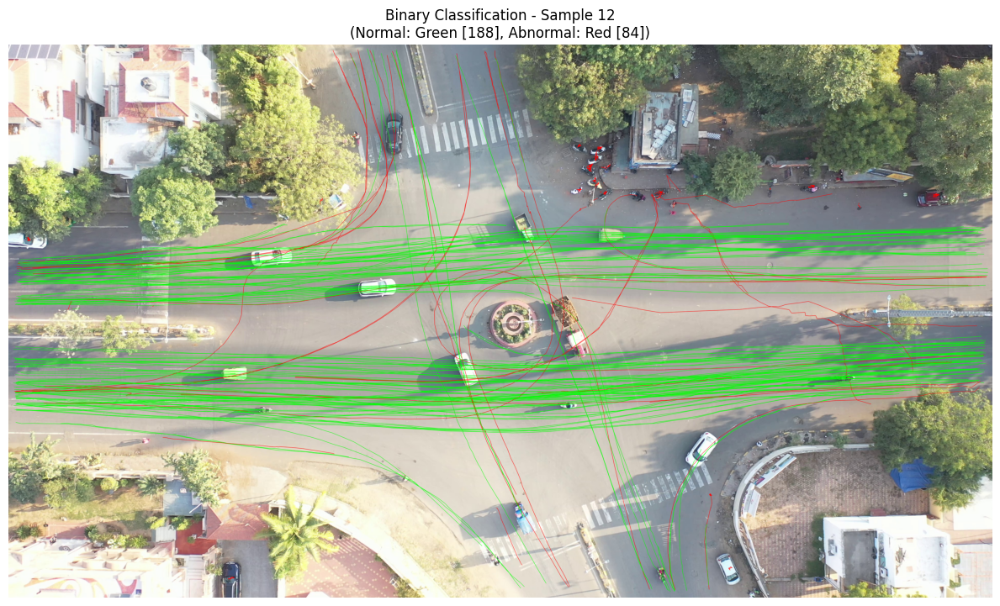


--- Script Finished ---


In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
from tslearn.preprocessing import TimeSeriesResampler
import time
import math
from typing import List, Tuple, Optional, Dict, Any

# -----------------------------
# Parameters & Paths
# -----------------------------
sample = "12"  # Process folder "10" (adjust if needed)
folder_path = sample  # Folder containing CSV files for the sample
image_path = f"sample{sample}.jpg" # Background image for visualization
output_dir = "trajectory_images_clustered"
os.makedirs(output_dir, exist_ok=True)

n_points = 50  # Number of points to resample each trajectory

# !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
# !! CRITICAL FOR ACCURACY: TUNE Thresholds & Define Central Zone BELOW !!
# !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!

# --- Thresholds for the custom clustering rules ---
# --- ADJUST THESE VALUES based on observing the classification results ---
threshold_params = {
    'moving_threshold': 10.0,      # Max distance (pixels) to be considered stationary (Cluster 8).
    'straightness_threshold': 1.2, # Max ratio (total path / direct distance) for straight (Cluster 1). Lower = stricter.
    'hv_angle_tolerance_deg': 25.0,# Tolerance (degrees) around 0/180 and +/-90 for finding H/V reference angles.
    'turn_threshold': np.deg2rad(20), # Min angle diff (radians) from closest H/V ref_angle to be considered a turn.
    'sudden_change_threshold': np.deg2rad(45), # Min internal angle jump (radians) for sudden change (Cluster 9).
    'final_segment_straight_tolerance': np.deg2rad(25), # Angle tolerance (radians) for final segment direction check in rules 3 & 5.
}

# --- Central Junction/Roundabout Zone Polygon ---
# --- REPLACE Example Coordinates with ACTUAL pixel coordinates from the image ---
# --- Use an image editor (like GIMP, Paint.NET, Photoshop) to find vertex (x, y) coords ---
# --- The ACCURACY of rules 3, 5, 6, 7 DEPENDS ENTIRELY ON THIS POLYGON ---
central_zone_polygon = np.array([
    # [x1, y1], [x2, y2], [x3, y3], [x4, y4], ... # Add vertices in order (clockwise or counter-clockwise)
    [350, 300], [500, 300], [500, 400], [350, 400] # <--- EXAMPLE! REPLACE THIS LINE!
], dtype=np.int32) # Use int32 for OpenCV functions

# -----------------------------
# Helper Functions
# -----------------------------

def extract_trajectory(csv_path: str) -> Optional[np.ndarray]:
    """Extracts frame number and center coordinates from a CSV file."""
    try:
        df = pd.read_csv(csv_path, usecols=["frameNo", "left", "top", "w", "h"])
        df["center_x"] = df["left"] + df["w"] / 2
        df["center_y"] = df["top"] + df["h"] / 2
        # Return as numpy array [frameNo, x, y]
        return df[["frameNo", "center_x", "center_y"]].values
    except FileNotFoundError:
        # print(f"Warning: File not found {csv_path}")
        return None
    except Exception as e:
        print(f"Error processing file {csv_path}: {e}")
        return None

def resample_trajectory(traj: np.ndarray, n_points: int) -> Optional[np.ndarray]:
    """Resamples a trajectory (x, y coordinates) to have a fixed number of points."""
    if not isinstance(traj, np.ndarray) or traj.ndim != 2 or traj.shape[1] != 3 or traj.shape[0] < 2:
        return None # Cannot resample invalid or too short trajectories

    xy_coords = traj[:, 1:3]
    traj_reshaped = xy_coords.reshape(1, xy_coords.shape[0], 2) # Reshape for tslearn

    try:
        resampler = TimeSeriesResampler(sz=n_points)
        resampled_xy = resampler.fit_transform(traj_reshaped)[0]

        # Interpolate frame numbers
        original_frames = traj[:, 0]
        resampled_frames = np.linspace(original_frames[0], original_frames[-1], n_points)

        resampled_traj = np.column_stack((resampled_frames, resampled_xy))
        return resampled_traj
    except Exception as e:
        # print(f"Error during resampling trajectory with shape {traj.shape}: {e}. Skipping.")
        return None

def load_data(folder_path: str, n_points: int) -> Tuple[List[np.ndarray], List[str]]:
    """Loads trajectories from CSV files in a folder and resamples them."""
    if not os.path.isdir(folder_path):
          print(f"Error: Source folder '{folder_path}' not found.")
          return [], []

    csv_files = [f for f in os.listdir(folder_path) if f.endswith('.csv')]
    print(f"Found {len(csv_files)} CSV files in {folder_path}")

    trajectories = []
    fnames = []
    valid_traj_count = 0

    for fname in csv_files:
        full_path = os.path.join(folder_path, fname)
        traj_raw = extract_trajectory(full_path)

        if traj_raw is not None and len(traj_raw) >= 2:
            traj_resampled = resample_trajectory(traj_raw, n_points)
            if traj_resampled is not None:
                trajectories.append(traj_resampled)
                fnames.append(fname)
                valid_traj_count += 1

    print(f"Successfully loaded and resampled {valid_traj_count} valid trajectories (>= 2 points).")
    return trajectories, fnames

def angle_between_points(p1: np.ndarray, p2: np.ndarray) -> float:
    """Compute the angle (radians, -pi to pi) of the vector from point p1 to p2."""
    delta = p2 - p1 # Assumes p1, p2 are [x, y]
    return np.arctan2(delta[1], delta[0]) # atan2(y, x)

def smallest_angle_diff(angle1: float, angle2: float) -> float:
    """Smallest signed difference (angle1 - angle2) in radians [-pi, pi]."""
    diff = angle1 - angle2
    return (diff + np.pi) % (2 * np.pi) - np.pi # Wrap difference

def detect_sudden_change(traj: np.ndarray, change_threshold_rad: float) -> Tuple[bool, float]:
    """Checks if the maximum change in segment direction exceeds the threshold."""
    pts = traj[:, 1:3]
    if len(pts) < 3: return False, 0.0 # Need >= 3 points for two segments

    segment_vectors = np.diff(pts, axis=0)
    norms = np.linalg.norm(segment_vectors, axis=1)
    # Filter out zero-length segments
    non_zero_mask = norms > 1e-6
    valid_vectors = segment_vectors[non_zero_mask]

    if len(valid_vectors) < 2: return False, 0.0 # Need >= 2 valid segments

    angles = np.arctan2(valid_vectors[:, 1], valid_vectors[:, 0])
    angle_diffs = smallest_angle_diff(angles[1:], angles[:-1])

    max_change = np.max(np.abs(angle_diffs)) if angle_diffs.size > 0 else 0.0
    return max_change > change_threshold_rad, max_change

def compute_reference_angles(trajectories: List[np.ndarray], straightness_thresh: float, angle_tolerance_deg: float) -> Tuple[Optional[float], Optional[float]]:
    """Computes reference direction angles for HORIZONTAL and VERTICAL straight trajectories."""
    straight_angles_h, straight_angles_v = [], []
    angle_tolerance_rad = np.deg2rad(angle_tolerance_deg)

    for traj in trajectories:
        pts = traj[:, 1:3]
        if len(pts) < 2: continue
        start, end = pts[0], pts[-1]
        direct_distance = np.linalg.norm(end - start)
        if direct_distance < 1e-3: continue # Skip nearly stationary

        total_path = np.sum(np.linalg.norm(np.diff(pts, axis=0), axis=1))
        if total_path < 1e-3: continue

        ratio = total_path / direct_distance
        if ratio < straightness_thresh: # Check straightness
            traj_angle = angle_between_points(start, end)
            # Check proximity to horizontal (0 or pi)
            if abs(smallest_angle_diff(traj_angle, 0)) < angle_tolerance_rad or \
               abs(smallest_angle_diff(traj_angle, np.pi)) < angle_tolerance_rad:
                straight_angles_h.append(traj_angle)
            # Check proximity to vertical (pi/2 or -pi/2)
            elif abs(smallest_angle_diff(traj_angle, np.pi/2)) < angle_tolerance_rad or \
                 abs(smallest_angle_diff(traj_angle, -np.pi/2)) < angle_tolerance_rad:
                straight_angles_v.append(traj_angle)

    ref_angle_h, ref_angle_v = None, None
    # Compute circular mean and snap to primary axes
    if straight_angles_h:
        mean_angle_h = np.arctan2(np.mean(np.sin(straight_angles_h)), np.mean(np.cos(straight_angles_h)))
        ref_angle_h = 0 if abs(smallest_angle_diff(mean_angle_h, 0)) < abs(smallest_angle_diff(mean_angle_h, np.pi)) else np.pi
        print(f"Found {len(straight_angles_h)} straight H trajectories. Ref Angle H: {np.rad2deg(ref_angle_h):.1f} deg")
    else: print("Warning: No straight horizontal trajectories found for reference. Rule 5 might be unreliable.")

    if straight_angles_v:
        mean_angle_v = np.arctan2(np.mean(np.sin(straight_angles_v)), np.mean(np.cos(straight_angles_v)))
        ref_angle_v = np.pi/2 if abs(smallest_angle_diff(mean_angle_v, np.pi/2)) < abs(smallest_angle_diff(mean_angle_v, -np.pi/2)) else -np.pi/2
        print(f"Found {len(straight_angles_v)} straight V trajectories. Ref Angle V: {np.rad2deg(ref_angle_v):.1f} deg")
    else: print("Warning: No straight vertical trajectories found for reference. Rules 3 & 4 might be unreliable.")

    return ref_angle_h, ref_angle_v

def intersects_zone(traj: np.ndarray, zone_polygon: np.ndarray) -> bool:
    """Checks if any point of the trajectory falls inside the given polygon zone."""
    if zone_polygon is None or len(zone_polygon) < 3: return False
    points = traj[:, 1:3].astype(np.float32) # Ensure float for cv2.pointPolygonTest
    for point in points:
        # pointPolygonTest returns >0 (inside), 0 (on boundary), <0 (outside)
        if cv2.pointPolygonTest(zone_polygon, tuple(point), False) >= 0:
            return True
    return False

# -----------------------------
# Rule-Based Clustering Logic (10 Rules)
# -----------------------------
def assign_custom_cluster_10(traj: np.ndarray, ref_angle_h: Optional[float], ref_angle_v: Optional[float],
                             central_zone: np.ndarray, thresholds: Dict[str, float]) -> int:
    """Assigns cluster ID 1-10 based on the defined rules. Returns 10 as fallback."""
    pts = traj[:, 1:3]
    if len(pts) < 2: return 10 # Cannot classify with < 2 points

    start, end = pts[0], pts[-1]
    direct_distance = np.linalg.norm(end - start)

    # Rule 8: Stationary (or very short movement)
    if direct_distance < thresholds['moving_threshold']: return 8

    # Rule 9: Sudden Change in Direction
    had_sudden_change, _ = detect_sudden_change(traj, thresholds['sudden_change_threshold'])
    if had_sudden_change: return 9

    # Calculate path properties
    total_path = np.sum(np.linalg.norm(np.diff(pts, axis=0), axis=1))
    # Handle potential division by zero
    straightness_ratio = total_path / direct_distance if direct_distance > 1e-6 else np.inf
    traj_angle = angle_between_points(start, end)
    is_intersecting_center = intersects_zone(traj, central_zone)

    # Determine closest reference direction (H or V) and the angle difference
    closest_ref, angle_diff_h, angle_diff_v, angle_diff_closest = None, np.inf, np.inf, np.inf
    min_angle_diff_abs = np.inf
    if ref_angle_h is not None:
        angle_diff_h = smallest_angle_diff(traj_angle, ref_angle_h)
        if abs(angle_diff_h) < min_angle_diff_abs:
            min_angle_diff_abs = abs(angle_diff_h)
            closest_ref = 'H'
            angle_diff_closest = angle_diff_h
    if ref_angle_v is not None:
        angle_diff_v = smallest_angle_diff(traj_angle, ref_angle_v)
        if abs(angle_diff_v) < min_angle_diff_abs:
            min_angle_diff_abs = abs(angle_diff_v)
            closest_ref = 'V'
            angle_diff_closest = angle_diff_v

    # --- Apply Rules ---

    # Rule 1: Straight Trajectory
    if straightness_ratio < thresholds['straightness_threshold']: return 1

    # If no reference angles found, cannot apply turn rules accurately -> Fallback
    if closest_ref is None: return 10

    # --- Turning Rules (require a reference direction) ---
    turn_thresh_rad = thresholds['turn_threshold']
    final_seg_tol_rad = thresholds['final_segment_straight_tolerance']

    # Rule 2: Left Turn relative to Horizontal ref
    if closest_ref == 'H' and angle_diff_h > turn_thresh_rad: return 2

    # Rule 4: Right Turn relative to Vertical ref
    if closest_ref == 'V' and angle_diff_v < -turn_thresh_rad: return 4

    # Rule 3: Left Turn relative to Vertical, Intersects Zone, Exits Vertically
    if closest_ref == 'V' and angle_diff_v > turn_thresh_rad and is_intersecting_center:
        if len(pts) >= 2 and ref_angle_v is not None:
            final_segment_angle = angle_between_points(pts[-2], pts[-1])
            if abs(smallest_angle_diff(final_segment_angle, ref_angle_v)) < final_seg_tol_rad:
                return 3

    # Rule 5: Right Turn relative to Horizontal, Intersects Zone, Exits Horizontally
    if closest_ref == 'H' and angle_diff_h < -turn_thresh_rad and is_intersecting_center:
         if len(pts) >= 2 and ref_angle_h is not None:
            final_segment_angle = angle_between_points(pts[-2], pts[-1])
            if abs(smallest_angle_diff(final_segment_angle, ref_angle_h)) < final_seg_tol_rad:
                return 5

    # Rule 6: General Right Turn, Intersects Zone (and not already Rule 4 or 5)
    if angle_diff_closest < -turn_thresh_rad and is_intersecting_center:
        # Check if it already qualified specifically as Rule 4 or 5
        is_rule_4 = (closest_ref == 'V' and angle_diff_v < -turn_thresh_rad)
        is_rule_5 = False
        if closest_ref == 'H' and angle_diff_h < -turn_thresh_rad: # Condition for Rule 5 turn direction
            if len(pts) >= 2 and ref_angle_h is not None:
                final_segment_angle = angle_between_points(pts[-2], pts[-1])
                if abs(smallest_angle_diff(final_segment_angle, ref_angle_h)) < final_seg_tol_rad:
                    is_rule_5 = True # It also met the exit condition for Rule 5

        if not is_rule_4 and not is_rule_5: # If it's a right turn intersecting center, but not the specific types 4 or 5
            return 6

    # Rule 7: General Right Turn, Does NOT Intersect Zone (and not already Rule 4)
    if angle_diff_closest < -turn_thresh_rad and not is_intersecting_center:
        is_rule_4 = (closest_ref == 'V' and angle_diff_v < -turn_thresh_rad)
        if not is_rule_4: # If it's a right turn not intersecting center and wasn't Rule 4
            return 7

    # Rule 10: Fallback / Other (e.g., unclassified turns, complex paths)
    return 10

def assign_custom_clusters_10(trajectories: List[np.ndarray], central_zone: np.ndarray,
                              thresholds: Dict[str, float]) -> np.ndarray:
    """Applies the 10 custom rule–based clustering to a list of trajectories."""
    if not trajectories: return np.array([])
    clusters = []
    # Compute reference angles ONCE based on all trajectories
    ref_h, ref_v = compute_reference_angles(trajectories, thresholds['straightness_threshold'], thresholds['hv_angle_tolerance_deg'])

    for traj in trajectories:
        try:
            cid = assign_custom_cluster_10(traj, ref_h, ref_v, central_zone, thresholds)
            clusters.append(cid)
        except Exception as e:
            # print(f"Error assigning cluster for a trajectory: {e}")
            clusters.append(10) # Assign fallback on error

    return np.array(clusters)

# -----------------------------
# Visualization Functions
# -----------------------------

# Define BGR colors for OpenCV drawing
CLUSTER_COLORS_BGR = {
    1: (180, 119, 31),   # Blue
    2: (44, 160, 44),   # Green
    3: (40, 39, 214),   # Red
    4: (188, 119, 148), # Purple
    5: (0, 127, 255),   # Orange
    6: (75, 86, 140),   # Brown
    7: (194, 119, 227), # Pink
    8: (0, 0, 0),       # Black
    9: (34, 189, 188),  # Olive/Yellow
    10: (127, 127, 127), # Gray
    -1: (150, 150, 150) # Fallback Gray
}

# Define HEX colors for Matplotlib plotting (approximating BGR)
CLUSTER_COLORS_HEX = {
     1: '#1F77B4', 2: '#2CA02C', 3: '#D62728', 4: '#9467BD', 5: '#FF7F0E',
     6: '#8C564B', 7: '#E377C2', 8: '#000000', 9: '#BCBD22', 10: '#7F7F7F',
     -1: '#ADB5BD' # Fallback Gray
}

def _create_fallback_image(trajectories: List[np.ndarray], width: int = 800, height: int = 600) -> np.ndarray:
    """Creates a blank black background image, trying to estimate bounds."""
    max_x, max_y = width, height
    if trajectories:
        try:
            all_pts = np.concatenate([t[:, 1:3] for t in trajectories if t is not None and len(t)>0])
            if len(all_pts) > 0:
                 max_x = int(np.max(all_pts[:, 0])) + 50 # Add padding
                 max_y = int(np.max(all_pts[:, 1])) + 50 # Add padding
        except Exception:
            pass # Keep default size if calculation fails
    print(f"Warning: Created blank background ({max_x}x{max_y}).")
    return np.zeros((max_y, max_x, 3), dtype=np.uint8)

def _draw_trajectories(image: np.ndarray, trajectories: List[np.ndarray], labels: np.ndarray,
                       color_map: Dict[int, Tuple[int, int, int]], line_thickness: int = 1) -> np.ndarray:
    """Helper to draw trajectories with specified colors on an image."""
    overlay = image.copy()
    for i, traj in enumerate(trajectories):
        if traj is None or len(traj) < 2: continue
        label = labels[i] if i < len(labels) else -1 # Handle potential length mismatch
        color = color_map.get(label, CLUSTER_COLORS_BGR[-1]) # Use fallback color if label not in map
        pts_int = traj[:, 1:3].astype(np.int32)
        try:
            cv2.polylines(overlay, [pts_int], isClosed=False, color=color, thickness=line_thickness, lineType=cv2.LINE_AA)
        except Exception as draw_err:
            # print(f"Warning: Error drawing trajectory {i}: {draw_err}")
            pass
    return overlay

def visualize_all_tracks_on_image(image_path: str, trajectories: List[np.ndarray], labels: np.ndarray,
                                  title: str, output_filename_base: str, sample_id: Optional[str] = None):
    """Visualizes ALL trajectories with 10 cluster colors overlaid on the background image."""
    try:
        image = cv2.imread(image_path)
        if image is None:
            print(f"Error: Background image not found at {image_path}. Creating fallback.")
            image = _create_fallback_image(trajectories)
    except Exception as e:
        print(f"Error reading image {image_path}: {e}. Creating fallback.")
        image = _create_fallback_image(trajectories)

    image_with_tracks = _draw_trajectories(image, trajectories, labels, CLUSTER_COLORS_BGR, line_thickness=1)

    # Save the image
    timestamp = time.strftime("%Y%m%d-%H%M%S")
    sample_str = f"_{sample_id}" if sample_id else ""
    save_path = os.path.join(output_dir, f"{output_filename_base}{sample_str}_{timestamp}.png")
    try:
        cv2.imwrite(save_path, image_with_tracks)
        print(f"Combined trajectory visualization (10 clusters) saved to {save_path}")
    except Exception as e:
        print(f"Error saving combined image: {e}")

    # Display using matplotlib
    plt.figure(figsize=(12, 9))
    plt.imshow(cv2.cvtColor(image_with_tracks, cv2.COLOR_BGR2RGB)) # Convert BGR to RGB for plt
    plt.title(title)
    plt.axis("off")
    plt.tight_layout()
    plt.show()

def visualize_binary_classification_on_image(image_path: str, trajectories: List[np.ndarray], binary_labels: np.ndarray,
                                             output_dir: str, sample_id: str, title: str):
    """Visualizes ALL trajectories on the background image, colored by BINARY classification (Normal=Green, Abnormal=Red)."""
    try:
        image = cv2.imread(image_path)
        if image is None:
            print(f"Error: Background image not found at {image_path}. Creating fallback.")
            image = _create_fallback_image(trajectories)
    except Exception as e:
        print(f"Error reading image {image_path}: {e}. Creating fallback.")
        image = _create_fallback_image(trajectories)

    # Define colors (BGR for OpenCV)
    binary_color_map = {
        0: (0, 255, 0),   # Green for Normal (label 0)
        1: (0, 0, 255)    # Red for Abnormal (label 1)
    }
    line_thickness = 1

    image_with_tracks = _draw_trajectories(image, trajectories, binary_labels, binary_color_map, line_thickness)

    normal_count = np.sum(binary_labels == 0)
    abnormal_count = np.sum(binary_labels == 1)

    # Save the combined image
    timestamp = time.strftime("%Y%m%d-%H%M%S")
    save_path = os.path.join(output_dir, f"BinaryClassification_NormalGreen_AbnormalRed_on_image_{sample_id}_{timestamp}.png")
    try:
        cv2.imwrite(save_path, image_with_tracks)
        print(f"Binary classification visualization saved to {save_path}")
        print(f" > Normal (Green): {normal_count}, Abnormal (Red): {abnormal_count}")
    except Exception as e:
        print(f"Error saving binary classification image: {e}")

    # Display using matplotlib
    plt.figure(figsize=(12, 9))
    plt.imshow(cv2.cvtColor(image_with_tracks, cv2.COLOR_BGR2RGB))
    plt.title(f"{title}\n(Normal: Green [{normal_count}], Abnormal: Red [{abnormal_count}])")
    plt.axis("off")
    plt.tight_layout()
    plt.show()

def visualize_trajectories_10_grid(trajectories: List[np.ndarray], labels: np.ndarray,
                                    title: str = "Trajectories Grid Plot", sample_id: Optional[str] = None):
    """Visualizes trajectories on a blank grid with colors based on 10 cluster labels."""
    plt.figure(figsize=(14, 11))
    label_counts = {i: 0 for i in range(1, 11)}
    plotted_labels_legend = set()

    for i, traj in enumerate(trajectories):
        if traj is None or len(traj) < 2: continue
        current_label = int(labels[i]) if i < len(labels) else -1
        col = CLUSTER_COLORS_HEX.get(current_label, CLUSTER_COLORS_HEX[-1])
        if 1 <= current_label <= 10:
             label_counts[current_label] += 1

        label_str = f"Cluster {current_label}" if current_label != -1 else "Invalid Cluster"
        plt.plot(traj[:, 1], traj[:, 2], color=col, alpha=0.6, linewidth=1.5,
                 label=label_str if current_label !=-1 and current_label not in plotted_labels_legend else "")
        plt.plot(traj[0, 1], traj[0, 2], 'o', color=col, markersize=3) # Mark start point
        if current_label != -1:
            plotted_labels_legend.add(current_label)

    plt.title(title)
    plt.xlabel("X Coordinate (pixels)")
    plt.ylabel("Y Coordinate (pixels)")
    plt.gca().invert_yaxis() # Origin top-left
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.axis('equal')

    # Create Legend with counts
    handles, current_labels_plt = plt.gca().get_legend_handles_labels()
    unique_handles_dict = {}
    for h, l in zip(handles, current_labels_plt):
        if l not in unique_handles_dict:
            try:
                cluster_num = int(l.split(' ')[1])
                count = label_counts.get(cluster_num, 0)
                h.set_label(f'Cluster {cluster_num} ({count})')
                unique_handles_dict[l] = h
            except: # Keep original label if parsing fails
                 unique_handles_dict[l] = h

    # Add legend entries for clusters potentially not plotted
    for i in range(1, 11):
        label_str = f'Cluster {i}'
        full_label_str = f'Cluster {i} ({label_counts.get(i, 0)})'
        if label_str not in unique_handles_dict:
            unique_handles_dict[label_str] = plt.Line2D([0], [0], color=CLUSTER_COLORS_HEX.get(i, CLUSTER_COLORS_HEX[-1]), lw=2, label=full_label_str)

    # Sort legend entries numerically
    sorted_handles = sorted(unique_handles_dict.values(), key=lambda h: int(h.get_label().split(' ')[1]) if 'Cluster' in h.get_label() else 99)

    plt.legend(handles=sorted_handles, title="Clusters (Count)", bbox_to_anchor=(1.03, 1), loc='upper left', borderaxespad=0.)
    plt.tight_layout(rect=[0, 0, 0.85, 1]) # Adjust layout for legend

    # Save the plot
    timestamp = time.strftime("%Y%m%d-%H%M%S")
    sample_str = f"_{sample_id}" if sample_id else ""
    save_path = os.path.join(output_dir, f"clusters10_grid{sample_str}_{timestamp}.png")
    try:
        plt.savefig(save_path, bbox_inches='tight')
        print(f"Cluster grid plot saved to {save_path}")
    except Exception as e: print(f"Error saving grid plot: {e}")
    plt.show()


# -----------------------------
# Main Execution Pipeline
# -----------------------------
if __name__ == "__main__":

    print(f"--- Trajectory Clustering & Classification Script ---")
    print(f"Processing sample folder: '{folder_path}'")
    print(f"Output directory: '{output_dir}'")

    print("\nUsing thresholds:")
    for k, v in threshold_params.items():
        unit = " (ratio)" if k == 'straightness_threshold' else \
               " (pixels)" if k == 'moving_threshold' else \
               " (degrees)" if 'deg' in k else \
               " (radians)"
        print(f"  {k}: {v:.4f}{unit}")

    # --- Validate Central Zone Polygon ---
    if central_zone_polygon is None or not isinstance(central_zone_polygon, np.ndarray) or central_zone_polygon.ndim != 2 or len(central_zone_polygon) < 3:
          print("\n!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!")
          print("!! ERROR: 'central_zone_polygon' is not defined correctly.       !!")
          print("!! Please edit the script and add the ACTUAL pixel coordinates   !!")
          print(f"!! for the central area from '{image_path}'.                   !!")
          print("!! Rules 3, 5, 6, 7 depend on this. Execution halted.          !!")
          print("!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!")
          exit()
    else:
          print(f"\nCentral zone polygon defined with {len(central_zone_polygon)} vertices.")
          # Optional: Draw the zone on the base image for verification here if needed

    # 1. Load Trajectories
    print("\n[Step 1/4] Loading and resampling data...")
    start_time = time.time()
    trajectories, file_names = load_data(folder_path, n_points)
    load_time = time.time() - start_time
    print(f"Data loading completed in {load_time:.2f} seconds.")

    if not trajectories:
        print("No valid trajectories found or loaded. Exiting.")
        exit()

    # 2. Assign Custom Clusters based on 10 Rules
    print("\n[Step 2/4] Assigning custom clusters (10 rules)...")
    start_time = time.time()
    custom_clusters = assign_custom_clusters_10(trajectories, central_zone_polygon, threshold_params)
    cluster_time = time.time() - start_time
    print(f"Assigned {len(custom_clusters)} cluster labels in {cluster_time:.2f} seconds.")

    if len(custom_clusters) != len(trajectories):
         print(f"Warning: Mismatch between trajectory count ({len(trajectories)}) and cluster count ({len(custom_clusters)}). Visualization might be affected.")
         # Attempt to align or proceed with caution
         min_len = min(len(trajectories), len(custom_clusters))
         trajectories = trajectories[:min_len]
         custom_clusters = custom_clusters[:min_len]
         file_names = file_names[:min_len]

    unique_clusters, counts = np.unique(custom_clusters, return_counts=True)
    print("10-Rule Cluster distribution:")
    cluster_dist_str = ", ".join([f"Cluster {cl_id}: {count}" for cl_id, count in zip(unique_clusters, counts)])
    print(f"  {cluster_dist_str}")

    # 3. Perform Binary Classification based on Clustering Results
    print("\n[Step 3/4] Performing binary classification (Rule 1=Normal, Rules 2-10=Abnormal)...")
    # 0 = Normal (Straight, Cluster 1)
    # 1 = Abnormal (Clusters 2-10)
    binary_labels_derived = np.array([0 if c == 1 else 1 for c in custom_clusters])

    normal_count = np.sum(binary_labels_derived == 0)
    abnormal_count = np.sum(binary_labels_derived == 1)
    print(f"Binary Classification Results: Normal (Cluster 1): {normal_count}, Abnormal (Clusters 2-10): {abnormal_count}")

    # 4. Visualization
    print("\n[Step 4/4] Generating visualizations...")

    # --- Visualization 1: All tracks overlaid on the background image (using 10 cluster colors) ---
    print("Generating visualization 1/3: All tracks (10 clusters) on background image...")
    visualize_all_tracks_on_image(image_path, trajectories, custom_clusters,
                                  title=f"All Trajectories by 10 Clusters (Sample: {sample})",
                                  output_filename_base="all_tracks_10clusters_on_image",
                                  sample_id=sample)

    # --- Visualization 2: Tracks plotted on a blank grid (using 10 cluster colors) ---
    print("\nGenerating visualization 2/3: Tracks (10 clusters) on grid plot...")
    visualize_trajectories_10_grid(trajectories, custom_clusters,
                                   title=f"Rule-Based Trajectory Clustering - 10 Rules (Sample: {sample})",
                                   sample_id=sample)

    # --- Visualization 3: Binary Classification (Normal/Abnormal) on ONE image ---
    print("\nGenerating visualization 3/3: Binary Classification (Normal/Abnormal) on background image...")
    visualize_binary_classification_on_image(image_path, trajectories, binary_labels_derived,
                                             output_dir, sample,
                                             title=f"Binary Classification - Sample {sample}")

    print("\n--- Script Finished ---")

--- Trajectory Clustering & Classification Script ---
Processing sample folder: '10'
Output directory: 'trajectory_images_clustered'

Using thresholds:
  moving_threshold: 10.0000 (pixels)
  straightness_threshold: 1.2000 (ratio)
  hv_angle_tolerance_deg: 25.0000 (degrees)
  turn_threshold: 0.3491 (radians)
  sudden_change_threshold: 0.7854 (radians)
  final_segment_straight_tolerance: 0.4363 (radians)

Central zone polygon defined with 4 vertices.

[Step 1/4] Loading and resampling data...
Found 159 CSV files in 10
Successfully loaded and resampled 148 valid trajectories (>= 2 points).
Data loading completed in 0.54 seconds.

[Step 2/4] Assigning custom clusters (10 rules)...
Found 80 straight horizontal trajectories. Ref Angle H: 0.0 deg
Found 20 straight vertical trajectories. Ref Angle V: -90.0 deg
Assigned 148 cluster labels in 0.02 seconds.
10-Rule Cluster distribution:
  Cluster 1: 80, Cluster 4: 4, Cluster 7: 6, Cluster 8: 29, Cluster 9: 28, Cluster 10: 1

[Step 3/4] Performing

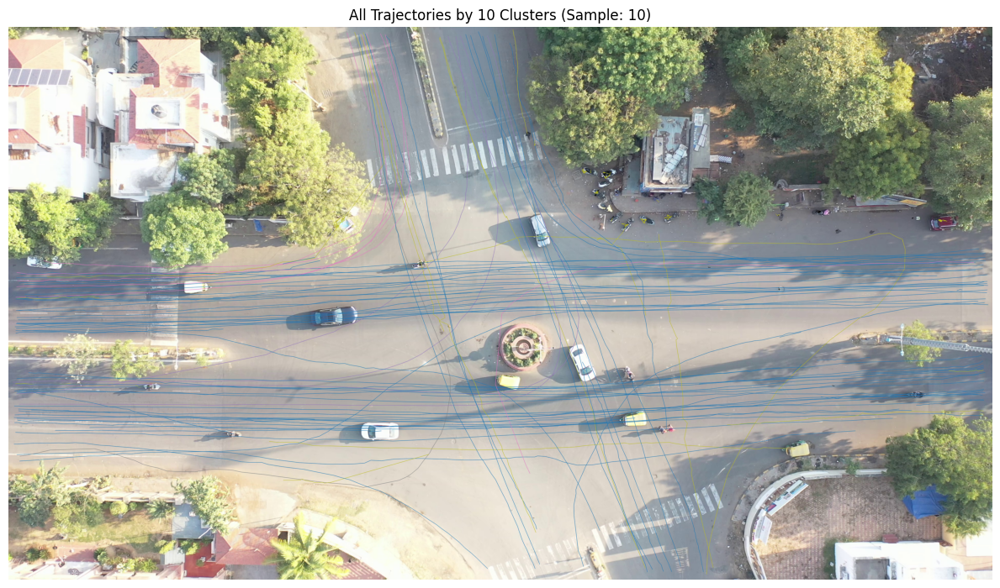


Generating visualization 2/3: Tracks (10 clusters) on grid plot...
Cluster grid plot saved to trajectory_images_clustered\clusters10_grid_10_20250413-004828.png


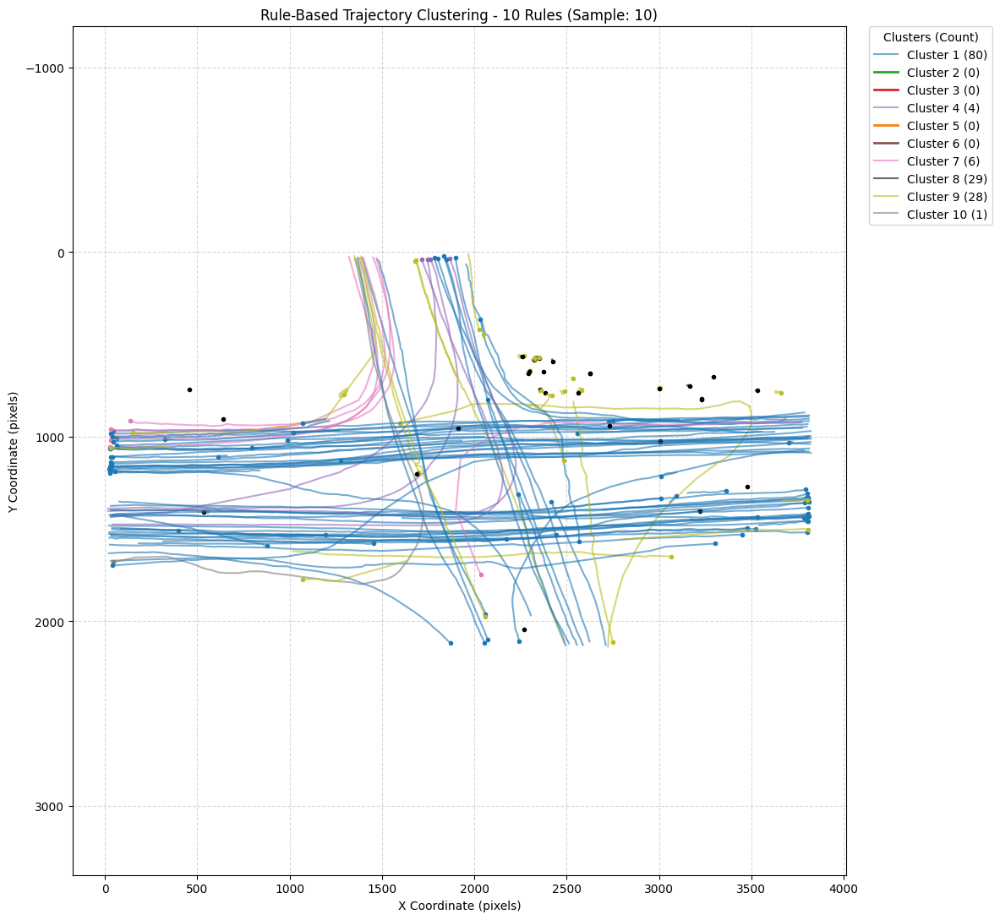


Generating visualization 3/3: Binary Classification (Normal/Abnormal) on background image...
Binary classification visualization saved to trajectory_images_clustered\BinaryClassification_NormalGreen_AbnormalRed_on_image_10_20250413-004829.png
 > Normal (Green): 80, Abnormal (Red): 68


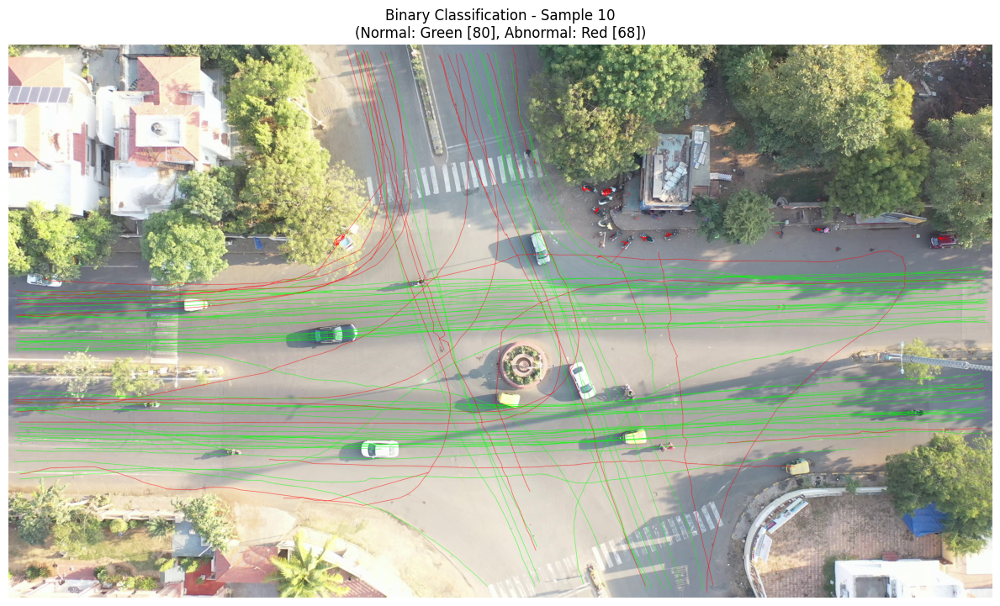


[Step 4/4-B] Applying ML clustering using TimeSeriesKMeans and evaluating classification accuracy...
Shape of time series data for ML clustering: (148, 50, 2)
ML Cluster labels assigned: [2 0 3 2 2 2 0 0 2 2 0 0 2 3 2 2 1 2 0 2 1 2 2 2 2 3 0 1 1 3 2 0 2 0 2 0 3
 2 2 2 2 1 2 0 1 2 2 1 0 2 0 2 2 0 0 2 3 0 2 2 3 2 1 1 2 0 0 2 0 2 1 0 2 1
 2 3 2 3 2 3 0 0 3 3 0 2 1 3 2 3 3 2 0 1 2 1 3 3 0 2 2 0 1 2 1 3 3 2 1 1 1
 2 3 0 2 2 2 2 0 2 0 3 3 3 2 3 2 0 3 2 2 3 1 2 3 2 2 2 2 3 2 2 2 0 3 2 1 2]


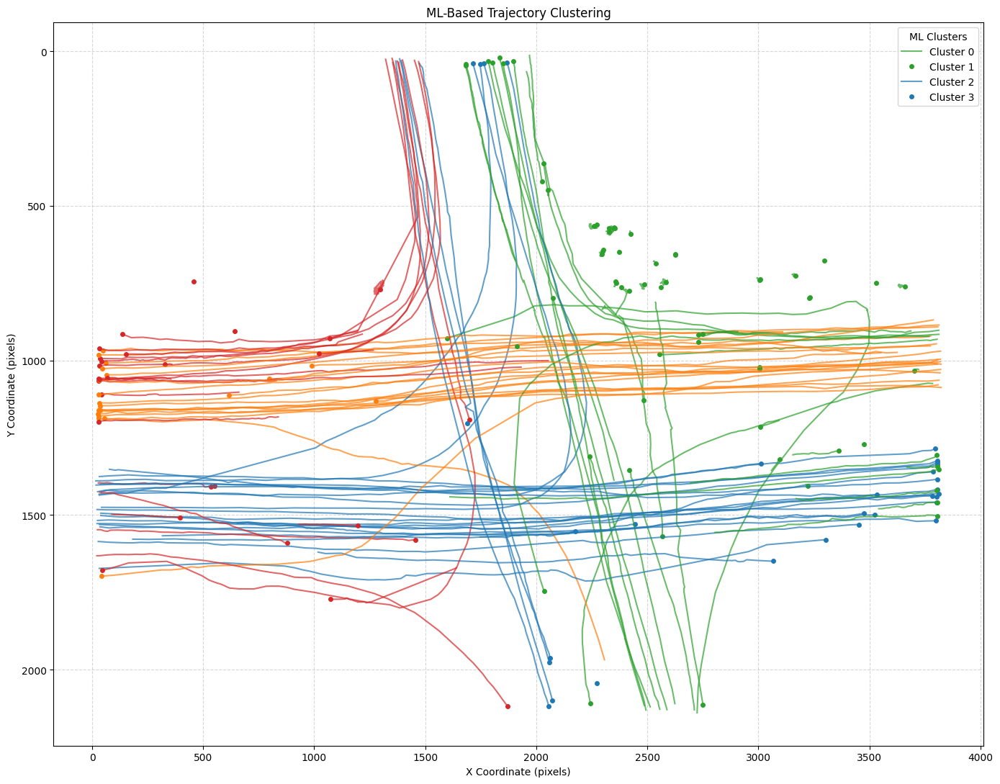


ML-derived binary classification accuracy (compared to rule-based binary labels): 70.27%

--- Script Finished ---


In [10]:
import os
import time
import math
from typing import List, Tuple, Optional, Dict, Any

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2

# For trajectory resampling and ML clustering
from tslearn.preprocessing import TimeSeriesResampler
from tslearn.clustering import TimeSeriesKMeans
from sklearn.metrics import accuracy_score

# -----------------------------
# Parameters & Paths
# -----------------------------

sample = "10"  # Process folder "12" (adjust if needed)
folder_path = sample  # Folder containing CSV files for the sample
image_path = f"sample{sample}.jpg"  # Background image for visualization
output_dir = "trajectory_images_clustered"
os.makedirs(output_dir, exist_ok=True)

n_points = 50  # Number of points to resample each trajectory

# !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
# !! CRITICAL FOR ACCURACY: TUNE Thresholds & Define Central Zone BELOW   !!
# !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!

# --- Thresholds for the custom clustering rules ---
threshold_params = {
    'moving_threshold': 10.0,      # Max distance (pixels) to be considered stationary (Cluster 8).
    'straightness_threshold': 1.2,   # Max ratio (total path / direct distance) for straight (Cluster 1). Lower = stricter.
    'hv_angle_tolerance_deg': 25.0,  # Tolerance (degrees) around 0/180 and +/-90 for finding H/V reference angles.
    'turn_threshold': np.deg2rad(20),  # Min angle diff (radians) from closest H/V ref_angle to be considered a turn.
    'sudden_change_threshold': np.deg2rad(45),  # Min internal angle jump (radians) for sudden change (Cluster 9).
    'final_segment_straight_tolerance': np.deg2rad(25),  # Angle tolerance (radians) for final segment direction check in rules 3 & 5.
}

# --- Central Junction/Roundabout Zone Polygon ---
# --- REPLACE Example Coordinates with ACTUAL pixel coordinates from the image ---
central_zone_polygon = np.array([
    [350, 300], [500, 300], [500, 400], [350, 400]  # <--- EXAMPLE! REPLACE THIS LINE!
], dtype=np.int32)

# -----------------------------
# Helper Functions
# -----------------------------
def extract_trajectory(csv_path: str) -> Optional[np.ndarray]:
    """Extracts frame number and center coordinates from a CSV file."""
    try:
        df = pd.read_csv(csv_path, usecols=["frameNo", "left", "top", "w", "h"])
        df["center_x"] = df["left"] + df["w"] / 2
        df["center_y"] = df["top"] + df["h"] / 2
        return df[["frameNo", "center_x", "center_y"]].values
    except FileNotFoundError:
        return None
    except Exception as e:
        print(f"Error processing file {csv_path}: {e}")
        return None

def resample_trajectory(traj: np.ndarray, n_points: int) -> Optional[np.ndarray]:
    """Resamples a trajectory (x, y coordinates) to have a fixed number of points."""
    if not isinstance(traj, np.ndarray) or traj.ndim != 2 or traj.shape[1] != 3 or traj.shape[0] < 2:
        return None
    xy_coords = traj[:, 1:3]
    traj_reshaped = xy_coords.reshape(1, xy_coords.shape[0], 2)  # Reshape for tslearn
    try:
        resampler = TimeSeriesResampler(sz=n_points)
        resampled_xy = resampler.fit_transform(traj_reshaped)[0]
        original_frames = traj[:, 0]
        resampled_frames = np.linspace(original_frames[0], original_frames[-1], n_points)
        resampled_traj = np.column_stack((resampled_frames, resampled_xy))
        return resampled_traj
    except Exception as e:
        return None

def load_data(folder_path: str, n_points: int) -> Tuple[List[np.ndarray], List[str]]:
    """Loads trajectories from CSV files in a folder and resamples them."""
    if not os.path.isdir(folder_path):
        print(f"Error: Source folder '{folder_path}' not found.")
        return [], []
    csv_files = [f for f in os.listdir(folder_path) if f.endswith('.csv')]
    print(f"Found {len(csv_files)} CSV files in {folder_path}")
    trajectories = []
    fnames = []
    valid_traj_count = 0
    for fname in csv_files:
        full_path = os.path.join(folder_path, fname)
        traj_raw = extract_trajectory(full_path)
        if traj_raw is not None and len(traj_raw) >= 2:
            traj_resampled = resample_trajectory(traj_raw, n_points)
            if traj_resampled is not None:
                trajectories.append(traj_resampled)
                fnames.append(fname)
                valid_traj_count += 1
    print(f"Successfully loaded and resampled {valid_traj_count} valid trajectories (>= 2 points).")
    return trajectories, fnames

def angle_between_points(p1: np.ndarray, p2: np.ndarray) -> float:
    """Compute the angle (radians, -pi to pi) of the vector from point p1 to p2."""
    delta = p2 - p1
    return np.arctan2(delta[1], delta[0])

def smallest_angle_diff(angle1: float, angle2: float) -> float:
    """Smallest signed difference (angle1 - angle2) in radians [-pi, pi]."""
    diff = angle1 - angle2
    return (diff + np.pi) % (2 * np.pi) - np.pi

def detect_sudden_change(traj: np.ndarray, change_threshold_rad: float) -> Tuple[bool, float]:
    """Checks if the maximum change in segment direction exceeds the threshold."""
    pts = traj[:, 1:3]
    if len(pts) < 3:
        return False, 0.0
    segment_vectors = np.diff(pts, axis=0)
    norms = np.linalg.norm(segment_vectors, axis=1)
    non_zero_mask = norms > 1e-6
    valid_vectors = segment_vectors[non_zero_mask]
    if len(valid_vectors) < 2:
        return False, 0.0
    angles = np.arctan2(valid_vectors[:, 1], valid_vectors[:, 0])
    angle_diffs = smallest_angle_diff(angles[1:], angles[:-1])
    max_change = np.max(np.abs(angle_diffs)) if angle_diffs.size > 0 else 0.0
    return max_change > change_threshold_rad, max_change

def compute_reference_angles(trajectories: List[np.ndarray], straightness_thresh: float, angle_tolerance_deg: float) -> Tuple[Optional[float], Optional[float]]:
    """Computes reference direction angles for horizontal and vertical trajectories."""
    straight_angles_h, straight_angles_v = [], []
    angle_tolerance_rad = np.deg2rad(angle_tolerance_deg)
    for traj in trajectories:
        pts = traj[:, 1:3]
        if len(pts) < 2:
            continue
        start, end = pts[0], pts[-1]
        direct_distance = np.linalg.norm(end - start)
        if direct_distance < 1e-3:
            continue
        total_path = np.sum(np.linalg.norm(np.diff(pts, axis=0), axis=1))
        if total_path < 1e-3:
            continue
        ratio = total_path / direct_distance
        if ratio < straightness_thresh:
            traj_angle = angle_between_points(start, end)
            if abs(smallest_angle_diff(traj_angle, 0)) < angle_tolerance_rad or abs(smallest_angle_diff(traj_angle, np.pi)) < angle_tolerance_rad:
                straight_angles_h.append(traj_angle)
            elif abs(smallest_angle_diff(traj_angle, np.pi/2)) < angle_tolerance_rad or abs(smallest_angle_diff(traj_angle, -np.pi/2)) < angle_tolerance_rad:
                straight_angles_v.append(traj_angle)
    ref_angle_h, ref_angle_v = None, None
    if straight_angles_h:
        mean_angle_h = np.arctan2(np.mean(np.sin(straight_angles_h)), np.mean(np.cos(straight_angles_h)))
        ref_angle_h = 0 if abs(smallest_angle_diff(mean_angle_h, 0)) < abs(smallest_angle_diff(mean_angle_h, np.pi)) else np.pi
        print(f"Found {len(straight_angles_h)} straight horizontal trajectories. Ref Angle H: {np.rad2deg(ref_angle_h):.1f} deg")
    else:
        print("Warning: No straight horizontal trajectories found for reference. Rule 5 might be unreliable.")
    if straight_angles_v:
        mean_angle_v = np.arctan2(np.mean(np.sin(straight_angles_v)), np.mean(np.cos(straight_angles_v)))
        ref_angle_v = np.pi/2 if abs(smallest_angle_diff(mean_angle_v, np.pi/2)) < abs(smallest_angle_diff(mean_angle_v, -np.pi/2)) else -np.pi/2
        print(f"Found {len(straight_angles_v)} straight vertical trajectories. Ref Angle V: {np.rad2deg(ref_angle_v):.1f} deg")
    else:
        print("Warning: No straight vertical trajectories found for reference. Rules 3 & 4 might be unreliable.")
    return ref_angle_h, ref_angle_v

def intersects_zone(traj: np.ndarray, zone_polygon: np.ndarray) -> bool:
    """Checks if any point of the trajectory falls inside the given polygon zone."""
    if zone_polygon is None or len(zone_polygon) < 3:
        return False
    points = traj[:, 1:3].astype(np.float32)
    for point in points:
        if cv2.pointPolygonTest(zone_polygon, tuple(point), False) >= 0:
            return True
    return False

# -----------------------------
# Rule-Based Clustering Logic (10 Rules)
# -----------------------------
def assign_custom_cluster_10(traj: np.ndarray, ref_angle_h: Optional[float], ref_angle_v: Optional[float],
                             central_zone: np.ndarray, thresholds: Dict[str, float]) -> int:
    """Assigns cluster ID 1-10 based on the defined rules. Returns 10 as fallback."""
    pts = traj[:, 1:3]
    if len(pts) < 2:
        return 10
    start, end = pts[0], pts[-1]
    direct_distance = np.linalg.norm(end - start)
    if direct_distance < thresholds['moving_threshold']:
        return 8
    had_sudden_change, _ = detect_sudden_change(traj, thresholds['sudden_change_threshold'])
    if had_sudden_change:
        return 9
    total_path = np.sum(np.linalg.norm(np.diff(pts, axis=0), axis=1))
    straightness_ratio = total_path / direct_distance if direct_distance > 1e-6 else np.inf
    traj_angle = angle_between_points(start, end)
    is_intersecting_center = intersects_zone(traj, central_zone)
    closest_ref, angle_diff_h, angle_diff_v, angle_diff_closest = None, np.inf, np.inf, np.inf
    min_angle_diff_abs = np.inf
    if ref_angle_h is not None:
        angle_diff_h = smallest_angle_diff(traj_angle, ref_angle_h)
        if abs(angle_diff_h) < min_angle_diff_abs:
            min_angle_diff_abs = abs(angle_diff_h)
            closest_ref = 'H'
            angle_diff_closest = angle_diff_h
    if ref_angle_v is not None:
        angle_diff_v = smallest_angle_diff(traj_angle, ref_angle_v)
        if abs(angle_diff_v) < min_angle_diff_abs:
            min_angle_diff_abs = abs(angle_diff_v)
            closest_ref = 'V'
            angle_diff_closest = angle_diff_v
    if straightness_ratio < thresholds['straightness_threshold']:
        return 1
    if closest_ref is None:
        return 10
    turn_thresh_rad = thresholds['turn_threshold']
    final_seg_tol_rad = thresholds['final_segment_straight_tolerance']
    if closest_ref == 'H' and angle_diff_h > turn_thresh_rad:
        return 2
    if closest_ref == 'V' and angle_diff_v < -turn_thresh_rad:
        return 4
    if closest_ref == 'V' and angle_diff_v > turn_thresh_rad and is_intersecting_center:
        if len(pts) >= 2 and ref_angle_v is not None:
            final_segment_angle = angle_between_points(pts[-2], pts[-1])
            if abs(smallest_angle_diff(final_segment_angle, ref_angle_v)) < final_seg_tol_rad:
                return 3
    if closest_ref == 'H' and angle_diff_h < -turn_thresh_rad and is_intersecting_center:
        if len(pts) >= 2 and ref_angle_h is not None:
            final_segment_angle = angle_between_points(pts[-2], pts[-1])
            if abs(smallest_angle_diff(final_segment_angle, ref_angle_h)) < final_seg_tol_rad:
                return 5
    if angle_diff_closest < -turn_thresh_rad and is_intersecting_center:
        is_rule_4 = (closest_ref == 'V' and angle_diff_v < -turn_thresh_rad)
        is_rule_5 = False
        if closest_ref == 'H' and angle_diff_h < -turn_thresh_rad:
            if len(pts) >= 2 and ref_angle_h is not None:
                final_segment_angle = angle_between_points(pts[-2], pts[-1])
                if abs(smallest_angle_diff(final_segment_angle, ref_angle_h)) < final_seg_tol_rad:
                    is_rule_5 = True
        if not is_rule_4 and not is_rule_5:
            return 6
    if angle_diff_closest < -turn_thresh_rad and not is_intersecting_center:
        is_rule_4 = (closest_ref == 'V' and angle_diff_v < -turn_thresh_rad)
        if not is_rule_4:
            return 7
    return 10

def assign_custom_clusters_10(trajectories: List[np.ndarray], central_zone: np.ndarray,
                              thresholds: Dict[str, float]) -> np.ndarray:
    """Applies the 10 custom rule–based clustering to a list of trajectories."""
    if not trajectories:
        return np.array([])
    clusters = []
    ref_h, ref_v = compute_reference_angles(trajectories, thresholds['straightness_threshold'], thresholds['hv_angle_tolerance_deg'])
    for traj in trajectories:
        try:
            cid = assign_custom_cluster_10(traj, ref_h, ref_v, central_zone, thresholds)
            clusters.append(cid)
        except Exception as e:
            clusters.append(10)
    return np.array(clusters)

# -----------------------------
# Visualization Functions
# -----------------------------
# Define BGR colors for OpenCV drawing
CLUSTER_COLORS_BGR = {
    1: (180, 119, 31),
    2: (44, 160, 44),
    3: (40, 39, 214),
    4: (188, 119, 148),
    5: (0, 127, 255),
    6: (75, 86, 140),
    7: (194, 119, 227),
    8: (0, 0, 0),
    9: (34, 189, 188),
    10: (127, 127, 127),
    -1: (150, 150, 150)
}
CLUSTER_COLORS_HEX = {
     1: '#1F77B4', 2: '#2CA02C', 3: '#D62728', 4: '#9467BD', 5: '#FF7F0E',
     6: '#8C564B', 7: '#E377C2', 8: '#000000', 9: '#BCBD22', 10: '#7F7F7F',
     -1: '#ADB5BD'
}

def _create_fallback_image(trajectories: List[np.ndarray], width: int = 800, height: int = 600) -> np.ndarray:
    """Creates a blank black background image, trying to estimate bounds."""
    max_x, max_y = width, height
    if trajectories:
        try:
            all_pts = np.concatenate([t[:, 1:3] for t in trajectories if t is not None and len(t) > 0])
            if len(all_pts) > 0:
                max_x = int(np.max(all_pts[:, 0])) + 50
                max_y = int(np.max(all_pts[:, 1])) + 50
        except Exception:
            pass
    print(f"Warning: Created blank background ({max_x}x{max_y}).")
    return np.zeros((max_y, max_x, 3), dtype=np.uint8)

def _draw_trajectories(image: np.ndarray, trajectories: List[np.ndarray], labels: np.ndarray,
                       color_map: Dict[int, Tuple[int, int, int]], line_thickness: int = 1) -> np.ndarray:
    """Helper to draw trajectories with specified colors on an image."""
    overlay = image.copy()
    for i, traj in enumerate(trajectories):
        if traj is None or len(traj) < 2:
            continue
        label = labels[i] if i < len(labels) else -1
        color = color_map.get(label, CLUSTER_COLORS_BGR[-1])
        pts_int = traj[:, 1:3].astype(np.int32)
        try:
            cv2.polylines(overlay, [pts_int], isClosed=False, color=color, thickness=line_thickness, lineType=cv2.LINE_AA)
        except Exception as draw_err:
            pass
    return overlay

def visualize_all_tracks_on_image(image_path: str, trajectories: List[np.ndarray], labels: np.ndarray,
                                  title: str, output_filename_base: str, sample_id: Optional[str] = None):
    """Visualizes ALL trajectories with 10 cluster colors overlaid on the background image."""
    try:
        image = cv2.imread(image_path)
        if image is None:
            print(f"Error: Background image not found at {image_path}. Creating fallback.")
            image = _create_fallback_image(trajectories)
    except Exception as e:
        print(f"Error reading image {image_path}: {e}. Creating fallback.")
        image = _create_fallback_image(trajectories)
    image_with_tracks = _draw_trajectories(image, trajectories, labels, CLUSTER_COLORS_BGR, line_thickness=1)
    timestamp = time.strftime("%Y%m%d-%H%M%S")
    sample_str = f"_{sample_id}" if sample_id else ""
    save_path = os.path.join(output_dir, f"{output_filename_base}{sample_str}_{timestamp}.png")
    try:
        cv2.imwrite(save_path, image_with_tracks)
        print(f"Combined trajectory visualization (10 clusters) saved to {save_path}")
    except Exception as e:
        print(f"Error saving combined image: {e}")
    plt.figure(figsize=(12, 9))
    plt.imshow(cv2.cvtColor(image_with_tracks, cv2.COLOR_BGR2RGB))
    plt.title(title)
    plt.axis("off")
    plt.tight_layout()
    plt.show()

def visualize_trajectories_10_grid(trajectories: List[np.ndarray], labels: np.ndarray,
                                   title: str = "Trajectories Grid Plot", sample_id: Optional[str] = None):
    """Visualizes trajectories on a blank grid with colors based on 10 cluster labels."""
    plt.figure(figsize=(14, 11))
    label_counts = {i: 0 for i in range(1, 11)}
    plotted_labels_legend = set()
    for i, traj in enumerate(trajectories):
        if traj is None or len(traj) < 2:
            continue
        current_label = int(labels[i]) if i < len(labels) else -1
        col = CLUSTER_COLORS_HEX.get(current_label, CLUSTER_COLORS_HEX[-1])
        if 1 <= current_label <= 10:
            label_counts[current_label] += 1
        label_str = f"Cluster {current_label}" if current_label != -1 else "Invalid Cluster"
        plt.plot(traj[:, 1], traj[:, 2], color=col, alpha=0.6, linewidth=1.5,
                 label=label_str if current_label != -1 and current_label not in plotted_labels_legend else "")
        plt.plot(traj[0, 1], traj[0, 2], 'o', color=col, markersize=3)
        if current_label != -1:
            plotted_labels_legend.add(current_label)
    plt.title(title)
    plt.xlabel("X Coordinate (pixels)")
    plt.ylabel("Y Coordinate (pixels)")
    plt.gca().invert_yaxis()
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.axis('equal')
    handles, current_labels_plt = plt.gca().get_legend_handles_labels()
    unique_handles_dict = {}
    for h, l in zip(handles, current_labels_plt):
        if l not in unique_handles_dict:
            try:
                cluster_num = int(l.split(' ')[1])
                count = label_counts.get(cluster_num, 0)
                h.set_label(f'Cluster {cluster_num} ({count})')
                unique_handles_dict[l] = h
            except:
                unique_handles_dict[l] = h
    for i in range(1, 11):
        label_str = f'Cluster {i}'
        full_label_str = f'Cluster {i} ({label_counts.get(i, 0)})'
        if label_str not in unique_handles_dict:
            unique_handles_dict[label_str] = plt.Line2D([0], [0], color=CLUSTER_COLORS_HEX.get(i, CLUSTER_COLORS_HEX[-1]), lw=2, label=full_label_str)
    sorted_handles = sorted(unique_handles_dict.values(), key=lambda h: int(h.get_label().split(' ')[1]) if 'Cluster' in h.get_label() else 99)
    plt.legend(handles=sorted_handles, title="Clusters (Count)", bbox_to_anchor=(1.03, 1), loc='upper left', borderaxespad=0.)
    plt.tight_layout(rect=[0, 0, 0.85, 1])
    timestamp = time.strftime("%Y%m%d-%H%M%S")
    sample_str = f"_{sample_id}" if sample_id else ""
    save_path = os.path.join(output_dir, f"clusters10_grid{sample_str}_{timestamp}.png")
    try:
        plt.savefig(save_path, bbox_inches='tight')
        print(f"Cluster grid plot saved to {save_path}")
    except Exception as e:
        print(f"Error saving grid plot: {e}")
    plt.show()

def visualize_binary_classification_on_image(image_path: str, trajectories: List[np.ndarray], binary_labels: np.ndarray,
                                             output_dir: str, sample_id: str, title: str):
    """Visualizes trajectories on the background image colored by binary classification (Normal=Green, Abnormal=Red)."""
    try:
        image = cv2.imread(image_path)
        if image is None:
            print(f"Error: Background image not found at {image_path}. Creating fallback.")
            image = _create_fallback_image(trajectories)
    except Exception as e:
        print(f"Error reading image {image_path}: {e}. Creating fallback.")
        image = _create_fallback_image(trajectories)
    binary_color_map = {
        0: (0, 255, 0),   # Normal (Green)
        1: (0, 0, 255)    # Abnormal (Red)
    }
    line_thickness = 1
    image_with_tracks = _draw_trajectories(image, trajectories, binary_labels, binary_color_map, line_thickness)
    normal_count = np.sum(binary_labels == 0)
    abnormal_count = np.sum(binary_labels == 1)
    timestamp = time.strftime("%Y%m%d-%H%M%S")
    save_path = os.path.join(output_dir, f"BinaryClassification_NormalGreen_AbnormalRed_on_image_{sample_id}_{timestamp}.png")
    try:
        cv2.imwrite(save_path, image_with_tracks)
        print(f"Binary classification visualization saved to {save_path}")
        print(f" > Normal (Green): {normal_count}, Abnormal (Red): {abnormal_count}")
    except Exception as e:
        print(f"Error saving binary classification image: {e}")
    plt.figure(figsize=(12, 9))
    plt.imshow(cv2.cvtColor(image_with_tracks, cv2.COLOR_BGR2RGB))
    plt.title(f"{title}\n(Normal: Green [{normal_count}], Abnormal: Red [{abnormal_count}])")
    plt.axis("off")
    plt.tight_layout()
    plt.show()

# -----------------------------
# Main Execution Pipeline
# -----------------------------
if __name__ == "__main__":
    print(f"--- Trajectory Clustering & Classification Script ---")
    print(f"Processing sample folder: '{folder_path}'")
    print(f"Output directory: '{output_dir}'")
    print("\nUsing thresholds:")
    for k, v in threshold_params.items():
        unit = " (ratio)" if k == 'straightness_threshold' else \
               " (pixels)" if k == 'moving_threshold' else \
               " (degrees)" if 'deg' in k else " (radians)"
        print(f"  {k}: {v:.4f}{unit}")
    if central_zone_polygon is None or not isinstance(central_zone_polygon, np.ndarray) or central_zone_polygon.ndim != 2 or len(central_zone_polygon) < 3:
        print("\n!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!")
        print("!! ERROR: 'central_zone_polygon' is not defined correctly.         !!")
        print("!! Please edit the script and add the ACTUAL pixel coordinates           !!")
        print(f"!! for the central area from '{image_path}'.                          !!")
        print("!! Rules 3, 5, 6, 7 depend on this. Execution halted.                  !!")
        print("!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!")
        exit()
    else:
        print(f"\nCentral zone polygon defined with {len(central_zone_polygon)} vertices.")
    
    # 1. Load Trajectories
    print("\n[Step 1/4] Loading and resampling data...")
    start_time = time.time()
    trajectories, file_names = load_data(folder_path, n_points)
    load_time = time.time() - start_time
    print(f"Data loading completed in {load_time:.2f} seconds.")
    if not trajectories:
        print("No valid trajectories found or loaded. Exiting.")
        exit()

    # 2. Assign Custom Clusters Based on 10 Rules
    print("\n[Step 2/4] Assigning custom clusters (10 rules)...")
    start_time = time.time()
    custom_clusters = assign_custom_clusters_10(trajectories, central_zone_polygon, threshold_params)
    cluster_time = time.time() - start_time
    print(f"Assigned {len(custom_clusters)} cluster labels in {cluster_time:.2f} seconds.")
    if len(custom_clusters) != len(trajectories):
        print(f"Warning: Mismatch between trajectory count ({len(trajectories)}) and cluster count ({len(custom_clusters)}).")
        min_len = min(len(trajectories), len(custom_clusters))
        trajectories = trajectories[:min_len]
        custom_clusters = custom_clusters[:min_len]
        file_names = file_names[:min_len]
    unique_clusters, counts = np.unique(custom_clusters, return_counts=True)
    print("10-Rule Cluster distribution:")
    cluster_dist_str = ", ".join([f"Cluster {cl_id}: {count}" for cl_id, count in zip(unique_clusters, counts)])
    print(f"  {cluster_dist_str}")

    # 3. Perform Binary Classification Based on Rule-Based Clusters
    print("\n[Step 3/4] Performing binary classification (Rule 1=Normal, Rules 2-10=Abnormal)...")
    binary_labels_derived = np.array([0 if c == 1 else 1 for c in custom_clusters])
    normal_count = np.sum(binary_labels_derived == 0)
    abnormal_count = np.sum(binary_labels_derived == 1)
    print(f"Binary Classification Results: Normal (Cluster 1): {normal_count}, Abnormal (Clusters 2-10): {abnormal_count}")

    # 4A. Visualization: Rule-Based Clusters and Binary Classification
    print("\n[Step 4/4-A] Generating visualizations for rule-based classification...")
    print("Generating visualization 1/3: All tracks (10 clusters) on background image...")
    visualize_all_tracks_on_image(image_path, trajectories, custom_clusters,
                                  title=f"All Trajectories by 10 Clusters (Sample: {sample})",
                                  output_filename_base="all_tracks_10clusters_on_image",
                                  sample_id=sample)
    print("\nGenerating visualization 2/3: Tracks (10 clusters) on grid plot...")
    visualize_trajectories_10_grid(trajectories, custom_clusters,
                                   title=f"Rule-Based Trajectory Clustering - 10 Rules (Sample: {sample})",
                                   sample_id=sample)
    print("\nGenerating visualization 3/3: Binary Classification (Normal/Abnormal) on background image...")
    visualize_binary_classification_on_image(image_path, trajectories, binary_labels_derived,
                                             output_dir, sample,
                                             title=f"Binary Classification - Sample {sample}")

    # 4B. ML Clustering and Evaluation
    print("\n[Step 4/4-B] Applying ML clustering using TimeSeriesKMeans and evaluating classification accuracy...")
    # Prepare the time series data (extract x,y coordinates only)
    ts_data = np.array([traj[:, 1:3] for traj in trajectories])
    print("Shape of time series data for ML clustering:", ts_data.shape)
    # Set number of ML clusters (adjust k as needed)
    k = 4
    ml_model = TimeSeriesKMeans(n_clusters=k, metric="euclidean", max_iter=10, random_state=0)
    ml_cluster_labels = ml_model.fit_predict(ts_data)
    print("ML Cluster labels assigned:", ml_cluster_labels)
    # Visualize ML Clusters
    ML_CLUSTER_COLORS = ['#1F77B4', '#FF7F0E', '#2CA02C', '#D62728', '#9467BD', '#8C564B']
    plt.figure(figsize=(14, 11))
    for idx, traj in enumerate(ts_data):
        cluster_label = ml_cluster_labels[idx]
        color = ML_CLUSTER_COLORS[cluster_label % len(ML_CLUSTER_COLORS)]
        plt.plot(traj[:, 0], traj[:, 1], color=color, alpha=0.7, linewidth=1.5)
        plt.plot(traj[0, 0], traj[0, 1], 'o', color=color, markersize=4)
    plt.title("ML-Based Trajectory Clustering")
    plt.xlabel("X Coordinate (pixels)")
    plt.ylabel("Y Coordinate (pixels)")
    plt.gca().invert_yaxis()
    plt.legend([f"Cluster {i}" for i in range(k)], title="ML Clusters")
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

    # --- Map ML clusters to binary labels using majority vote from rule-based binary labels ---
    ml_binary_labels = np.empty_like(ml_cluster_labels)
    for cluster in np.unique(ml_cluster_labels):
        indices = np.where(ml_cluster_labels == cluster)[0]
        # Majority vote among rule-based binary labels for this ML cluster
        vote = np.bincount(binary_labels_derived[indices])
        mapped_label = np.argmax(vote)  # 0 if majority are normal, 1 otherwise
        ml_binary_labels[indices] = mapped_label

    # Calculate and print the accuracy (comparison between ML-derived binary labels and rule-based binary labels)
    acc = accuracy_score(binary_labels_derived, ml_binary_labels)
    print(f"\nML-derived binary classification accuracy (compared to rule-based binary labels): {acc*100:.2f}%")
    
    print("\n--- Script Finished ---")
